# Machine Learning Project 
# Group 13

#### Fatma Özel 57037
#### Helton Mendonça 56870
#### Leandro Duarte 64372

Observation: This jupyter notebook was conceded to be executed top to bottom, if not some problems may occur

## Task 0 (Know your Data) - Exploratory Data Analysis

## 0.1. Loading Data

In [1]:
#Install libraries if needed
%pip install ydata-profiling

Note: you may need to restart the kernel to use updated packages.


In [155]:
import pandas as pd
import numpy as np

df = pd.read_csv('PetFinder_dataset.csv')

## 0.2. Understanding Data
---
For this section we used ydata pandas profiling(https://docs.profiling.ydata.ai/latest/). A toolbox that enables automatic exploration of data. It was shown to us by Professor Cátia Pesquita. 

In [3]:
from ydata_profiling import ProfileReport

profile_before_cleaning = ProfileReport(df,
                        title="Profiling Report - PetAdoption before cleaning",
                        explorative=True,
                        sensitive=True)
profile_before_cleaning

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Overview

* This dataset contains 25 Variables. 
* 14993 total observations. 
* Out of those 25 variables, 10 are categorical 4 text and 11 numeric. 
* We have a total of 1278 missing cells.No duplicate rows were found.
* In the Alert tabs we can observe some signals the algorithm pointed too like high correlations,imbalance issues and missiing values problems. Well be studying those more in detail.

### Variable Analysis
Let's start by analysing all the variables of the dataset, the amount of nulls and type of each one.

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14993 entries, 0 to 14992
Data columns (total 24 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Type           14993 non-null  int64  
 1   Name           13728 non-null  object 
 2   Age            14993 non-null  int64  
 3   Breed1         14993 non-null  int64  
 4   Breed2         14993 non-null  int64  
 5   Gender         14993 non-null  int64  
 6   Color1         14993 non-null  int64  
 7   Color2         14993 non-null  int64  
 8   Color3         14993 non-null  int64  
 9   MaturitySize   14993 non-null  int64  
 10  FurLength      14993 non-null  int64  
 11  Vaccinated     14993 non-null  int64  
 12  Dewormed       14993 non-null  int64  
 13  Sterilized     14993 non-null  int64  
 14  Health         14993 non-null  int64  
 15  Quantity       14993 non-null  int64  
 16  Fee            14993 non-null  int64  
 17  State          14993 non-null  int64  
 18  Rescue

Some of the date have the wrong type assigned, like **Name**, **RescuerID**, **Description**, **PetID** that have the object type assigned to them and **PhotoAmt** that should be an integer but is assigned to float.

We can change the type of these columns using the `astype` method from pandas.

We can also see that there's some null values in the **Name** and **Description** columns and we could eliminate those using the `dropna` method from pandas, but we'll adress those later on.

In [5]:
pd.set_option('display.max_columns', None)
df.head(10)

,Type,Name,Age,Breed1,Breed2,Gender,Color1,Color2,Color3,MaturitySize,FurLength,Vaccinated,Dewormed,Sterilized,Health,Quantity,Fee,State,RescuerID,VideoAmt,Description,PetID,PhotoAmt,AdoptionSpeed
0,2,Nibble,3,299,0,1,1,7,0,1,1,2,2,2,1,1,100,41326,8480853f516546f6cf33aa88cd76c379,0,Nibble is a 3+ month old ball of cuteness. He ...,86e1089a3,1.0,2
1,2,No Name Yet,1,265,0,1,1,2,0,2,2,3,3,3,1,1,0,41401,3082c7125d8fb66f7dd4bff4192c8b14,0,I just found it alone yesterday near my apartm...,6296e909a,2.0,0
2,1,Brisco,1,307,0,1,2,7,0,2,2,1,1,2,1,1,0,41326,fa90fa5b1ee11c86938398b60abc32cb,0,Their pregnant mother was dumped by her irresp...,3422e4906,7.0,3
3,1,Miko,4,307,0,2,1,2,0,2,1,1,1,2,1,1,150,41401,9238e4f44c71a75282e62f7136c6b240,0,"Good guard dog, very alert, active, obedience ...",5842f1ff5,8.0,2
4,1,Hunter,1,307,0,1,1,0,0,2,1,2,2,2,1,1,0,41326,95481e953f8aed9ec3d16fc4509537e8,0,This handsome yet cute boy is up for adoption....,850a43f90,3.0,2
5,2,NaN,3,266,0,2,5,6,0,2,1,2,2,2,1,1,0,41326,22fe332bf9c924d4718005891c63fbed,0,This is a stray kitten that came to my house. ...,d24c30b4b,2.0,2
6,2,BULAT,12,264,264,1,1,0,0,2,3,2,2,3,1,1,300,41326,1e0b5a458b5b77f5af581d57ebf570b3,0,anyone within the area of ipoh or taiping who ...,1caa6fcdb,3.0,1
7,1,Siu Pak & Her 6 Puppies,0,307,0,2,1,2,7,2,1,2,2,2,1,6,0,41326,1fba5f6e5480946254590d48f9c5198d,0,Siu Pak just give birth on 13/6/10 to 6puppies...,97aa9eeac,9.0,3
8,2,NaN,2,265,0,2,6,0,0,2,2,2,2,2,1,1,0,41326,d8af7afece71334473575c9f70daf00d,0,"healthy and active, feisty kitten found in nei...",c06d167ca,6.0,1
9,2,Kitty,12,265,0,2,1,7,0,2,2,3,3,3,1,1,0,41326,1f3f36e4b18e94855b3e88af0852fdc4,0,"Very manja and gentle stray cat found, we woul...",7a0942d61,2.0,4


By analyzing the first 10 rows addictionally to the Profilinig Report we can already see some issues:

* Variables that we can already predict that won't be necessary for the analysis like **RescuerID**, **PetID** and **Description**
* The **Name** variable has NaN values but also some values like "No Name Yet" that also translates to a NaN
* The **VideoAmt** variable has the same value for all the first 10 rows wich can mean that it is not as important for the analysis
* Some rows represent more than one animal, wich complicate the analysis because most of the time they won't be all adopted at the same time, and we don't know to wich one of the animals is the data like the color and the health related columns in the row related to.
* There's some inconsistancy on the data, for example the row 7 has the name "Siu Pak & Her 6 Puppies" insinuating that all the 7 dogs are for adoption, but the quantity is 6 and the description says that they're 2 female puppies left, so it's suppose to be only 4 animals in total. And once again we don't know to wich animal is the variables related to.

In [6]:
print(df[df['Name'] == 'Siu Pak & Her 6 Puppies']['Description'].values[0])

Siu Pak just give birth on 13/6/10 to 6puppies. Interested pls call or sms me. Left 2female puppies on 2/7/10


### Analysing Variable **Name**

The variable name has some null values, because of that we should evaluate if we should drop the rows with Name = NaN.

To do that we'll start by evaluate if the **Name** has an important impact on the adoption speed of the animal.

In [7]:
import matplotlib.pyplot as plt

aux_df = df.copy()
aux_df['HasName'] = df['Name'].notna()

name_counts = aux_df['HasName'].value_counts()
adoption_speed_name_counts = aux_df.groupby(['AdoptionSpeed', 'HasName']).size().unstack(fill_value=0)

percentages_with_name = (adoption_speed_name_counts[True] / name_counts[True]) * 100
percentages_without_name = (adoption_speed_name_counts[False] / name_counts[False]) * 100

percentages_separate = pd.DataFrame({
    'With Name (%)': percentages_with_name,
    'Without Name (%)': percentages_without_name
})

print(percentages_separate)

               With Name (%)  Without Name (%)
AdoptionSpeed                                 
0                   2.797203          2.055336
1                  20.520105         21.581028
2                  27.127040         24.743083
3                  22.151807         17.233202
4                  27.403846         34.387352


We can see that the difference of percentages are not that different, we can conclude that the animal having a name or not won't influence the adoption speed, for that reason we can drop the **Name** column.

### Analysing Variable **VideoAmt**

We saw that the first 10 rows have the same value for this variable (0) and since we can observe in the Report that the **VideoAmt** has 96,2% of zero values it's possible to conclude that this variable has no impact for this study

In [8]:
video_amt_counts = df['VideoAmt'].value_counts().sort_index()
video_amt_counts_df = video_amt_counts.reset_index()
video_amt_counts_df.columns = ['VideoAmt', 'Count']
video_amt_counts_df


,VideoAmt,Count
0,0,14419
1,1,417
2,2,92
3,3,36
4,4,15
5,5,7
6,6,4
7,7,1
8,8,2


### Analysing Variable **Color**

We have 3 variables associated with color, and as we analyzed for the last variable, the **Color3** variable has basicaly just zeros as we can observe on the first ten rows and on the Report that tells us that the variable has 70.7% missing values (value 0).

Because of this we think that this variable can be omitted from this study.


In [9]:
color1_counts = df['Color1'].value_counts().sort_index()
color1_counts_df = color1_counts.reset_index()
color1_counts_df.columns = ['Color1', 'Color1 Count']

color2_counts = df['Color2'].value_counts().sort_index()
color2_counts_df = color2_counts.reset_index()
color2_counts_df.columns = ['Color2', 'Color2 Count']

color3_counts = df['Color3'].value_counts().sort_index()
color3_counts_df = color3_counts.reset_index()
color3_counts_df.columns = ['Color3', 'Color3 Count']


color_counts_df = pd.DataFrame({
    'Color1': color1_counts_df['Color1'],
    'Color1 Count': color1_counts_df['Color1 Count'],
    'Color2': color2_counts_df['Color2'],
    'Color2 Count': color2_counts_df['Color2 Count'],
    'Color3': color3_counts_df['Color3'],
    'Color3 Count': color3_counts_df['Color3 Count']
})

color_counts_df

,Color1,Color1 Count,Color2,Color2 Count,Color3,Color3 Count
0,1,7427,0,4471,0.0,10604.0
1,2,3750,2,3313,3.0,175.0
2,3,947,3,710,4.0,198.0
3,4,634,4,870,5.0,417.0
4,5,884,5,1128,6.0,378.0
5,6,684,6,1063,7.0,3221.0
6,7,667,7,3438,NaN,NaN


### Analyzing variable **Breed2**

The Report helps us verify that this variable has 71.8% of missing values (value 0), for this reason we won't be using it.

In [10]:
breed2_counts = df['Breed2'].value_counts().sort_index()
breed2_counts_df = breed2_counts.reset_index()
breed2_counts_df.columns = ['Breed2', 'Count']
breed2_counts_df

,Breed2,Count
0,0,10762
1,1,1
2,2,1
3,4,1
4,5,2
...,...,...
130,303,24
131,304,1
132,305,6
133,306,24


### Analyzing variable **Health**

Analyzing the report we can see that this variable is highly unbalanced, were most animals are healthy (value 1)

Because of this, we don't think this feature is relevant.>

In [11]:
health_counts = df['Health'].value_counts().sort_index()
health_counts_df = health_counts.reset_index()
health_counts_df.columns = ['Health', 'Count']
health_counts_df

,Health,Count
0,1,14478
1,2,481
2,3,34


## 0.3 Preprocessing Data

Now we'll start the cleaning and processing the data that will be used for both supervised and unsupervised learning tasks.

Starting by correcting the types and dropping the columns and rows that we defined previously that won't be necessary for the analysis.

In [156]:
df.drop(["RescuerID", "PetID", "Description", "Name", "VideoAmt", "Color3", "Breed2",'Health'], axis='columns', inplace=True)
df['PhotoAmt'] = df['PhotoAmt'].astype('int32')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14993 entries, 0 to 14992
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   Type           14993 non-null  int64
 1   Age            14993 non-null  int64
 2   Breed1         14993 non-null  int64
 3   Gender         14993 non-null  int64
 4   Color1         14993 non-null  int64
 5   Color2         14993 non-null  int64
 6   MaturitySize   14993 non-null  int64
 7   FurLength      14993 non-null  int64
 8   Vaccinated     14993 non-null  int64
 9   Dewormed       14993 non-null  int64
 10  Sterilized     14993 non-null  int64
 11  Quantity       14993 non-null  int64
 12  Fee            14993 non-null  int64
 13  State          14993 non-null  int64
 14  PhotoAmt       14993 non-null  int32
 15  AdoptionSpeed  14993 non-null  int64
dtypes: int32(1), int64(15)
memory usage: 1.8 MB


In [14]:
from ydata_profiling import ProfileReport
profile_after_cleaning = ProfileReport(df,
                        title="Profiling Report - PetAdoption before cleaning",
                        explorative=True,
                        sensitive=True)
profile_after_cleaning

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Task 1 (Supervised Learning) - Predicting Adoption and Adoption Speed

Auxiliar functions:

In [157]:
#Load content of the dataframe on tables

def load_data(df):
    nc = df.shape[1] # number of columns
    matrix = df.values # Convert dataframe to darray
    table_X = matrix [:, :nc-1] #get features
    table_y = matrix [:, nc-1] # get target       
    features = df.columns.values[0:nc-1] #get features names
    target_name = df.columns.values[nc-1] #get target name
    return table_X, table_y, features, target_name

In [158]:
# compute and plot confusion matrix train 
%matplotlib inline
from sklearn.metrics import confusion_matrix,  ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

def plot_confusion_matrix(set, set_pred, classifier, name):

    print("\nClassification Report for Test Set:")
    print(classification_report(set, set_pred))
    cm_train = confusion_matrix(set, set_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm_train,
                                  display_labels=classifier.classes_)
    disp.plot()
    plt.title(f"Confusion Matrix for {name} Classifier")
    plt.show()

In [159]:
from sklearn.model_selection import cross_validate, StratifiedKFold

# Metrics for the cross-validation/evaluation
scoring = {
    'accuracy': 'accuracy',
    'precision': 'precision_macro',
    'recall': 'recall_macro',
    'f1_score': 'f1_macro'
    
}

results = list()

cv = StratifiedKFold(shuffle=True, random_state=0)

def cross_validation(model, name,task,X,y):
    # Perform cross-validation 
    cv_scores = cross_validate(model, X, y, cv=cv, scoring=scoring, n_jobs=-1, return_train_score=True)
    test_metrics = []
    
    
    for metric in scoring.keys():
        print(f"Mean cross-validation {metric} in training: {cv_scores['train_' + metric].mean() * 100:.2f}% +/- {cv_scores['train_' + metric].std() * 100:.2f}%")
        
    print('\n')
        
    for metric in scoring.keys(): 
        metric_test_value = f"{cv_scores['test_' + metric].mean() * 100:.2f}% +/- {cv_scores['test_' + metric].std() * 100:.2f}%"
        print(f"Mean cross-validation {metric} in validation: {metric_test_value}") 
        test_metrics.append(metric_test_value)
    
    results.append({"Model":name, "Task":task, "Accuracy":test_metrics[0], "Precision":test_metrics[1], "Recall":test_metrics[2], "F1 Score":test_metrics[3]})

In [160]:
from sklearn.model_selection import  GridSearchCV

def hyperparameter_tuning(model, param_grid, X, y, cv=5):
    skf = StratifiedKFold(n_splits=cv, shuffle=True, random_state=0)
    grid_search = GridSearchCV(model, param_grid, cv=skf, scoring='f1_macro', n_jobs=-1, verbose=1)
    grid_search.fit(X, y)
    print(f"Best parameters for {type(model).__name__}: {grid_search.best_params_}")
    print(f"Best cross-validation f1 score: {grid_search.best_score_:.2f}")
    return grid_search

In [161]:
from sklearn.model_selection import  cross_val_score

def get_best_classifier(model, param_grid, X_train, Y_train, table_X, table_Y):
    # Ineer cv for hyperparameter tuning
    best_classifier = hyperparameter_tuning(model, param_grid, X_train, Y_train)

    #Outer CV for model evaluation
    outer_cv = StratifiedKFold(shuffle=True,random_state=0)

    #Nested CV
    nested_score = cross_val_score(model,table_X,table_Y,cv = outer_cv, scoring='f1_macro')

    print(f"Nested CV Score: { nested_score.mean():.2f}")

    return best_classifier

Auxiliar constants:

In [8]:
pa_bin_sup_task = "Predicting Adoption (Binary) - Supervised"
pa_bin_unsup_task = "Predicting Adoption (Binary) - Unsupervised"

pa_mul_sup_task = "Predicting Adoption (Multiclass) - Supervised"
pa_mul_unsup_task = "Predicting Adoption (Multiclass) - Unsupervised"

pa_bin_sup_dog_task = "Predicting Adoption for dogs (Binary) - Supervised"
pa_bin_sup_cat_task = "Predicting Adoption for cats (Binary) - Supervised"

pa_mul_sup_dog_task = "Predicting Adoption for dogs (Multiclass) - Supervised"
pa_mul_sup_cat_task = "Predicting Adoption for cats (Multiclass) - Supervised"

break_dict = {"Model": "", "Task": "----", "Accuracy": "", "Precision": "", "Recall": "", "F1-Score": ""}

## 1.1 Predicting  Adoption (binary classification)

Creation of the new target from AdoptionSpeed that is 1 if AdoptionSpeed <> 4 and 0 otherwise

In [163]:
bin_df = df.copy()

# Binary classification: 1 if AdoptionSpeed != 4, otherwise 0
bin_df['Adoption'] = bin_df['AdoptionSpeed'].apply(lambda x: 1 if x != 4 else 0)

# Remove the original AdoptionSpeed column
del bin_df['AdoptionSpeed']

# Check the data structure
bin_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14993 entries, 0 to 14992
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   Type          14993 non-null  int64
 1   Age           14993 non-null  int64
 2   Breed1        14993 non-null  int64
 3   Gender        14993 non-null  int64
 4   Color1        14993 non-null  int64
 5   Color2        14993 non-null  int64
 6   MaturitySize  14993 non-null  int64
 7   FurLength     14993 non-null  int64
 8   Vaccinated    14993 non-null  int64
 9   Dewormed      14993 non-null  int64
 10  Sterilized    14993 non-null  int64
 11  Quantity      14993 non-null  int64
 12  Fee           14993 non-null  int64
 13  State         14993 non-null  int64
 14  PhotoAmt      14993 non-null  int32
 15  Adoption      14993 non-null  int64
dtypes: int32(1), int64(15)
memory usage: 1.8 MB


It's important to check if this new variable is balanced, and we can verify that analyzing the counts.



In [164]:
#print the counts of adoption
bin_df['Adoption'].value_counts()

Adoption
1    10796
0     4197
Name: count, dtype: int64

It is not balanced with a ration of approximately 72/28. This means we have to deal with this has this imbalance can trick some models into over classifying the predictions as the majority classes.

### Dealing with Imbalance of binary class

 We will use [SMOTENC ](https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.SMOTENC.html) has we have categorical and numerical variables. Also we dont want to force too much the data or we can introduce too much noise, so we will implement a proportion of roughly 60/40 between the majority and minory class respectively. Along side that, to better tune this part we decided to implement a undersampling technique named [TomekLinks ](https://imbalanced-learn.org/stable/under_sampling.html#tomek-links). This method aims to eliminate instances from the majority class that are neigherest to the other class instances. This seeks to make boundary areas more clear, helping models better distinguish classes.

In [165]:
from imblearn.over_sampling import SMOTENC
from imblearn.under_sampling import TomekLinks
from sklearn.model_selection import train_test_split
import numpy as np

# Separate features and target
X = bin_df.drop(columns=['Adoption'])
y = bin_df['Adoption']

# Identify categorical features (column indices in X)
categorical_features = [0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 13]

# Apply SMOTENC
smote_nc = SMOTENC(categorical_features=categorical_features, sampling_strategy=0.55, random_state=42)
X_resampled, y_resampled = smote_nc.fit_resample(X, y)

# Now apply Tomek Links to clean up the resampled data
tomek = TomekLinks()
X_resampled, y_resampled = tomek.fit_resample(X_resampled, y_resampled)

# Check the distribution after both resampling and cleaning
print(np.bincount(y_resampled))

# Optionally, combine the resampled data back into bin_df
bin_df = X_resampled.copy()
bin_df['Adoption'] = y_resampled

[5937 9902]


This is a much softer split of around 63/37. Let´s see how the models behave after doing this

### Load data

In [14]:
table_X, table_Y, features, target_name = load_data(bin_df)
features

array(['Type', 'Age', 'Breed1', 'Gender', 'Color1', 'Color2',
       'MaturitySize', 'FurLength', 'Vaccinated', 'Dewormed',
       'Sterilized', 'Quantity', 'Fee', 'State', 'PhotoAmt'], dtype=object)

### Split the set

In [15]:
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(table_X, table_Y, random_state=0)

print(X_train.shape)
print(X_test.shape)

(11879, 15)
(3960, 15)


## KNN Classifier

In [23]:
from sklearn import neighbors

knn_bin = neighbors.KNeighborsClassifier(n_neighbors=3)

knn_bin

KNeighborsClassifier(n_neighbors=3)

### KNN Tuning

In [24]:
param_grid_knn = {
    'n_neighbors': range(3, 20, 2),  # Odd values from 3 to 19
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

knn_bin = get_best_classifier(knn_bin, param_grid_knn, X_train, Y_train, table_X, table_Y)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best parameters for KNeighborsClassifier: {'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'distance'}
Best cross-validation f1 score: 0.72
Nested CV Score: 0.70


### Cross-validation

In [25]:
# cross-validation for KNN
cross_validation(knn_bin,"KNN Classifier", pa_bin_sup_task, X_train, Y_train)

Mean cross-validation accuracy in training: 99.10% +/- 0.03%
Mean cross-validation precision in training: 98.89% +/- 0.03%
Mean cross-validation recall in training: 99.21% +/- 0.03%
Mean cross-validation f1_score in training: 99.04% +/- 0.03%


Mean cross-validation accuracy in validation: 74.37% +/- 0.63%
Mean cross-validation precision in validation: 72.75% +/- 0.73%
Mean cross-validation recall in validation: 71.39% +/- 0.66%
Mean cross-validation f1_score in validation: 71.87% +/- 0.67%


### Confusion Matrix


Fitting 5 folds for each of 36 candidates, totalling 180 fits

Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.65      0.62      0.64      1495
           1       0.78      0.80      0.79      2465

    accuracy                           0.73      3960
   macro avg       0.71      0.71      0.71      3960
weighted avg       0.73      0.73      0.73      3960



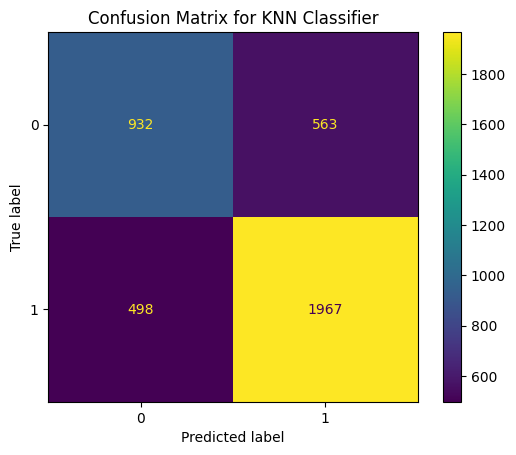

In [26]:
from sklearn.metrics import classification_report

knn_bin = knn_bin.fit(X_train, Y_train)
y_test_pred_knn_bin = knn_bin.predict(X_test)

plot_confusion_matrix(Y_test, y_test_pred_knn_bin, knn_bin, 'KNN')

KNN, appears to be overfitted, as we have high training scores but much lower on validation metrics.

## Decision Tree

In [33]:
from sklearn import tree

dt_Cart_Gini = tree.DecisionTreeClassifier(random_state=0) # criterion = "Gini" by default

dt_Cart_Gini

DecisionTreeClassifier(random_state=0)

### Decision Tree Tuning

In [34]:
param_grid_dt = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'auto', 'sqrt', 'log2']
}

dt_Cart_Gini = get_best_classifier(dt_Cart_Gini, param_grid_dt, X_train, Y_train, table_X, table_Y)

Fitting 5 folds for each of 432 candidates, totalling 2160 fits


c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
540 fits failed out of a total of 2160.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
272 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\bas

Best parameters for DecisionTreeClassifier: {'criterion': 'gini', 'max_depth': 10, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 5}
Best cross-validation f1 score: 0.69
Nested CV Score: 0.67


### Cross Validation

In [35]:
# cross-validation for Decision Tree

cross_validation(dt_Cart_Gini,"Decision Tree", pa_bin_sup_task, X_train, Y_train)

Mean cross-validation accuracy in training: 77.77% +/- 0.41%
Mean cross-validation precision in training: 76.88% +/- 0.30%
Mean cross-validation recall in training: 74.53% +/- 0.72%
Mean cross-validation f1_score in training: 75.29% +/- 0.65%


Mean cross-validation accuracy in validation: 71.77% +/- 0.59%
Mean cross-validation precision in validation: 69.89% +/- 0.68%
Mean cross-validation recall in validation: 68.01% +/- 0.81%
Mean cross-validation f1_score in validation: 68.52% +/- 0.80%


### Confusion Matrix

Fitting 5 folds for each of 432 candidates, totalling 2160 fits


c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
540 fits failed out of a total of 2160.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
268 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\bas


Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.61      0.56      0.58      1495
           1       0.75      0.78      0.76      2465

    accuracy                           0.70      3960
   macro avg       0.68      0.67      0.67      3960
weighted avg       0.69      0.70      0.70      3960



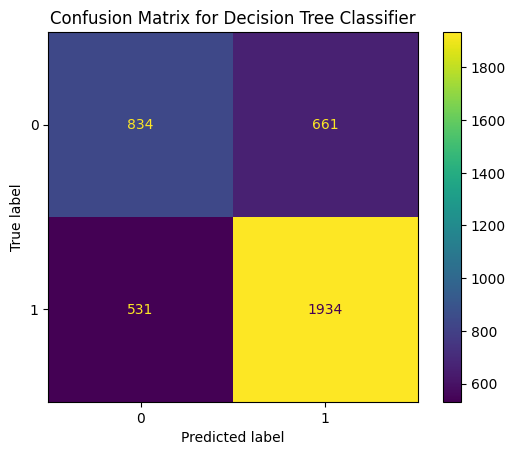

In [36]:
from sklearn.metrics import classification_report


dt_Cart_Gini = dt_Cart_Gini.fit(X_train, Y_train)
y_test_pred_dt_bin = dt_Cart_Gini.predict(X_test)

plot_confusion_matrix(Y_test, y_test_pred_dt_bin, dt_Cart_Gini, 'Decision Tree')

The decion tree seems to be underfitted, with moderate training and validation metrics.

## Logistic Regression

In [38]:
from sklearn.linear_model import LogisticRegression
logreg_bin = LogisticRegression(random_state=0)

logreg_bin

LogisticRegression(random_state=0)

### Logistic Regression Tuning

In [39]:
param_grid_lr = {
    'penalty': ['l1', 'l2'],
    'C': [0.01, 0.1, 1, 10, 100],
    'solver': ['liblinear'],
    'max_iter': [100, 200, 300]
}

logreg_bin = get_best_classifier(logreg_bin, param_grid_lr, X_train, Y_train, table_X, table_Y)

Fitting 5 folds for each of 30 candidates, totalling 150 fits
Best parameters for LogisticRegression: {'C': 10, 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear'}
Best cross-validation f1 score: 0.59


c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/st

Nested CV Score: 0.56


c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/st

### Cross Validation

In [40]:
# cross-validation for LogisticRegression
cross_validation(logreg_bin,"Logistic Regression", pa_bin_sup_task, X_train, Y_train)

Mean cross-validation accuracy in training: 67.35% +/- 0.25%
Mean cross-validation precision in training: 65.93% +/- 0.40%
Mean cross-validation recall in training: 59.72% +/- 0.30%
Mean cross-validation f1_score in training: 58.91% +/- 0.38%


Mean cross-validation accuracy in validation: 67.30% +/- 0.94%
Mean cross-validation precision in validation: 65.85% +/- 1.71%
Mean cross-validation recall in validation: 59.66% +/- 1.05%
Mean cross-validation f1_score in validation: 58.82% +/- 1.30%


### Confusion Matrix

Fitting 5 folds for each of 30 candidates, totalling 150 fits

Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.64      0.29      0.40      1495
           1       0.68      0.90      0.77      2465

    accuracy                           0.67      3960
   macro avg       0.66      0.60      0.59      3960
weighted avg       0.66      0.67      0.63      3960



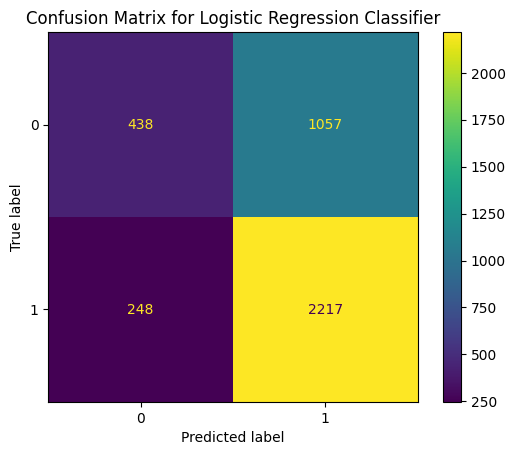

In [41]:
# Predictions for train set

logreg_bin = logreg_bin.fit(X_train,Y_train)
y_test_pred_log_bin = logreg_bin.predict(X_test)

plot_confusion_matrix(Y_test, y_test_pred_log_bin, logreg_bin, 'Logistic Regression')

Here we seem to be underfitting again.

## Naive Bayes

In [42]:
from sklearn.naive_bayes import GaussianNB
# from sklearn.naive_bayes import CategoricalNB
# from sklearn.naive_bayes import MultinomialNB
# from sklearn.naive_bayes import BernoulliNB

gnb_bin = GaussianNB()

gnb_bin

GaussianNB()

### Cross Validation



In [43]:
cross_validation(gnb_bin,"Naive Bayes", pa_bin_sup_task, X_train, Y_train)

Mean cross-validation accuracy in training: 67.00% +/- 0.44%
Mean cross-validation precision in training: 64.40% +/- 0.44%
Mean cross-validation recall in training: 63.56% +/- 0.16%
Mean cross-validation f1_score in training: 63.80% +/- 0.18%


Mean cross-validation accuracy in validation: 66.76% +/- 0.96%
Mean cross-validation precision in validation: 64.16% +/- 0.99%
Mean cross-validation recall in validation: 63.27% +/- 0.50%
Mean cross-validation f1_score in validation: 63.51% +/- 0.57%


### Confusion Matrix


Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.49      0.99      0.66      1839
           1       0.58      0.02      0.03      1910

    accuracy                           0.49      3749
   macro avg       0.54      0.50      0.34      3749
weighted avg       0.54      0.49      0.34      3749



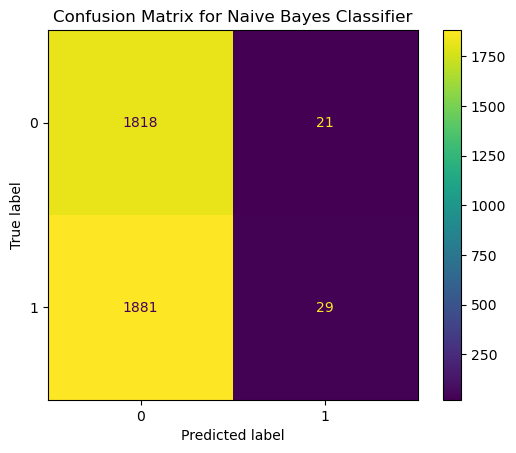

In [39]:
# Predictions for train set

gnb_bin = gnb_bin.fit(X_train,Y_train)
y_test_pred_gnb_bin = gnb_bin.predict(X_test)

plot_confusion_matrix(Y_test, y_test_pred_gnb_bin, gnb_bin, 'Naive Bayes')

We tried multiple Naive Bayes models but all had similar results. We only show the Gaussian approach. We can see that this classifier is also most likely underfitting 

## Random Forest

In [44]:
from sklearn.ensemble import RandomForestClassifier

rf_bin = RandomForestClassifier(random_state=0)

rf_bin

RandomForestClassifier(random_state=0)

### Random Forest Tuning

In [45]:
param_grid_rf = {
    'n_estimators': [50, 100, 200, 300],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

rf_bin = get_best_classifier(rf_bin, param_grid_rf, X_train, Y_train, table_X, table_Y)

Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best parameters for RandomForestClassifier: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
Best cross-validation f1 score: 0.73
Nested CV Score: 0.74


### Cross Validation

In [46]:
cross_validation(rf_bin, "Random Forest", pa_bin_sup_task, X_train, Y_train)

Mean cross-validation accuracy in training: 99.10% +/- 0.02%
Mean cross-validation precision in training: 99.08% +/- 0.04%
Mean cross-validation recall in training: 99.00% +/- 0.04%
Mean cross-validation f1_score in training: 99.04% +/- 0.03%


Mean cross-validation accuracy in validation: 75.80% +/- 0.41%
Mean cross-validation precision in validation: 74.47% +/- 0.44%
Mean cross-validation recall in validation: 72.63% +/- 0.60%
Mean cross-validation f1_score in validation: 73.24% +/- 0.55%


We can already see that this classifier is most likely overfitting on the training set

### Confusion Matrix

Fitting 5 folds for each of 216 candidates, totalling 1080 fits


c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\ma\core.py:2846: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,



Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.72      0.63      0.67      1495
           1       0.79      0.85      0.82      2465

    accuracy                           0.77      3960
   macro avg       0.75      0.74      0.74      3960
weighted avg       0.76      0.77      0.76      3960



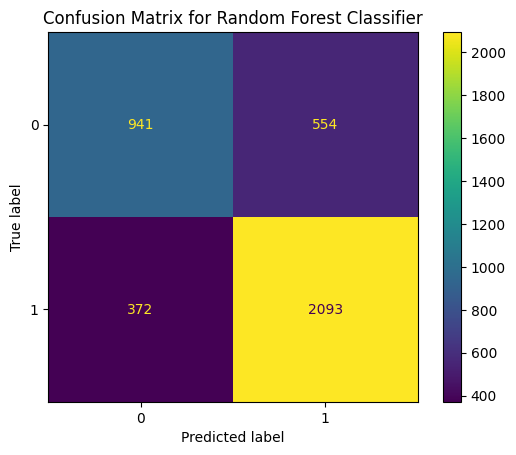

In [47]:
rf_bin = rf_bin.fit(X_train,Y_train)
y_test_pred_rf_bin = rf_bin.predict(X_test)

plot_confusion_matrix(Y_test, y_test_pred_rf_bin, rf_bin, 'Random Forest')

In [48]:
results.append(break_dict)

## 1.2 Predicting AdoptionSpeed (multiclass classification)

### Load data

In [49]:
table_X, table_Y, features, target_name = load_data(df)
features

array(['Type', 'Age', 'Breed1', 'Gender', 'Color1', 'Color2',
       'MaturitySize', 'FurLength', 'Vaccinated', 'Dewormed',
       'Sterilized', 'Quantity', 'Fee', 'State', 'PhotoAmt'], dtype=object)

### Split the set

In [50]:
X_train, X_test, Y_train, Y_test = train_test_split(table_X, table_Y, random_state=0)

print(X_train.shape)
print(X_test.shape)

(11244, 15)
(3749, 15)


## KNN Classifier

In [51]:
knn_mul = neighbors.KNeighborsClassifier(n_neighbors=3)
knn_mul

KNeighborsClassifier(n_neighbors=3)

### Knn Tuning

In [52]:
param_grid_knn = {
    'n_neighbors': range(3, 20, 2),  # Odd values from 3 to 19
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

knn_mul = get_best_classifier(knn_mul, param_grid_knn, X_train, Y_train, table_X, table_Y)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best parameters for KNeighborsClassifier: {'metric': 'manhattan', 'n_neighbors': 17, 'weights': 'distance'}
Best cross-validation f1 score: 0.30
Nested CV Score: 0.27


### Cross Validation

In [53]:
cross_validation(knn_mul, "KNN Classifier", pa_mul_sup_task, X_train, Y_train)

Mean cross-validation accuracy in training: 97.85% +/- 0.08%
Mean cross-validation precision in training: 97.58% +/- 0.17%
Mean cross-validation recall in training: 98.17% +/- 0.10%
Mean cross-validation f1_score in training: 97.86% +/- 0.11%


Mean cross-validation accuracy in validation: 36.34% +/- 1.11%
Mean cross-validation precision in validation: 30.92% +/- 1.54%
Mean cross-validation recall in validation: 29.56% +/- 0.64%
Mean cross-validation f1_score in validation: 29.39% +/- 0.54%


### Confusion Matrix

Fitting 5 folds for each of 36 candidates, totalling 180 fits

Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.32      0.06      0.11        94
           1       0.34      0.34      0.34       790
           2       0.32      0.36      0.34      1026
           3       0.33      0.25      0.29       808
           4       0.46      0.52      0.49      1031

    accuracy                           0.37      3749
   macro avg       0.35      0.31      0.31      3749
weighted avg       0.37      0.37      0.36      3749



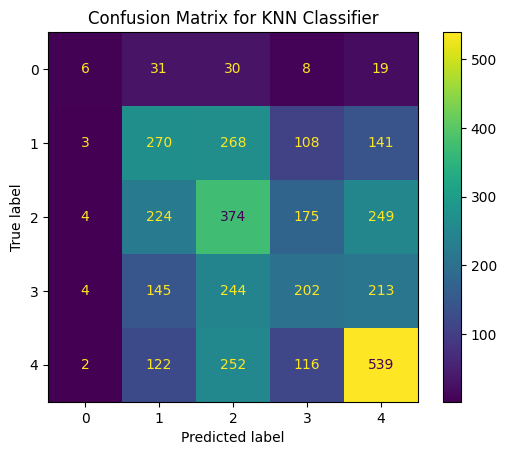

In [54]:
# predictions for train set

knn_mul = knn_mul.fit(X_train,Y_train)
y_test_pred = knn_mul.predict(X_test)

plot_confusion_matrix(Y_test, y_test_pred, knn_mul, name='KNN')

## Decision Tree

In [55]:
dt_Cart_Gini = tree.DecisionTreeClassifier(max_depth= 15, random_state=0) # criterion = "Gini" by default

### Decision Tree Tuning

In [56]:
param_grid_dt = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}

dt_Cart_Gini = get_best_classifier(dt_Cart_Gini, param_grid_dt, X_train, Y_train, table_X, table_Y)

Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best parameters for DecisionTreeClassifier: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 2}
Best cross-validation f1 score: 0.28
Nested CV Score: 0.28


### Cross Validation

In [57]:
cross_validation(dt_Cart_Gini, "Decision Tree", pa_mul_sup_task, X_train, Y_train)

Mean cross-validation accuracy in training: 48.70% +/- 0.88%
Mean cross-validation precision in training: 50.48% +/- 3.39%
Mean cross-validation recall in training: 40.98% +/- 1.24%
Mean cross-validation f1_score in training: 41.86% +/- 1.67%


Mean cross-validation accuracy in validation: 36.21% +/- 1.09%
Mean cross-validation precision in validation: 30.08% +/- 2.14%
Mean cross-validation recall in validation: 28.97% +/- 1.00%
Mean cross-validation f1_score in validation: 28.40% +/- 1.03%


### Confusion Matrix

Fitting 5 folds for each of 72 candidates, totalling 360 fits

Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        94
           1       0.34      0.41      0.37       790
           2       0.33      0.31      0.32      1026
           3       0.30      0.21      0.25       808
           4       0.46      0.55      0.50      1031

    accuracy                           0.37      3749
   macro avg       0.29      0.30      0.29      3749
weighted avg       0.35      0.37      0.36      3749



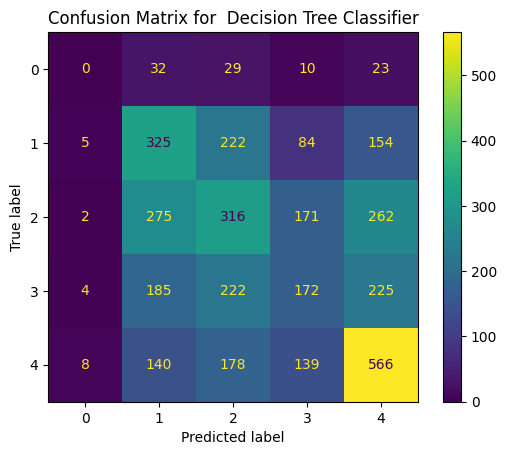

In [58]:
# predictions for test set
dt_Cart_Gini = dt_Cart_Gini.fit(X_train, Y_train)
y_test_pred = dt_Cart_Gini.predict(X_test)
plot_confusion_matrix(Y_test, y_test_pred, dt_Cart_Gini, name=' Decision Tree')

## Logistic Regression

In [59]:
logreg_mul = LogisticRegression(solver='liblinear', random_state=0)

logreg_mul

LogisticRegression(random_state=0, solver='liblinear')

### Logistic Regression Tuning

In [60]:
param_grid_lr_multiclass = {
    'penalty': ['none', 'l2'],
    'C': [0.01, 0.1, 1, 10, 100],
    'solver': ['newton-cg', 'lbfgs', 'sag', 'saga'],
    'max_iter': [100, 200, 300],
    'multi_class': ['ovr', 'multinomial']
}

logreg_mul = get_best_classifier(logreg_mul, param_grid_lr_multiclass, X_train, Y_train, table_X, table_Y)

Fitting 5 folds for each of 240 candidates, totalling 1200 fits


c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
600 fits failed out of a total of 1200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
103 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\bas

Best parameters for LogisticRegression: {'C': 0.1, 'max_iter': 200, 'multi_class': 'multinomial', 'penalty': 'l2', 'solver': 'newton-cg'}
Best cross-validation f1 score: 0.25
Nested CV Score: 0.19


### Cross Validation

In [61]:
cross_validation(logreg_mul,"Logistic Regression", pa_mul_sup_task, X_train, Y_train)

Mean cross-validation accuracy in training: 35.09% +/- 0.24%
Mean cross-validation precision in training: 27.18% +/- 0.28%
Mean cross-validation recall in training: 26.97% +/- 0.20%
Mean cross-validation f1_score in training: 25.17% +/- 0.23%


Mean cross-validation accuracy in validation: 34.75% +/- 0.88%
Mean cross-validation precision in validation: 26.96% +/- 0.75%
Mean cross-validation recall in validation: 26.68% +/- 0.72%
Mean cross-validation f1_score in validation: 24.85% +/- 0.86%


### Confusion Matrix

Fitting 5 folds for each of 240 candidates, totalling 1200 fits


c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
600 fits failed out of a total of 1200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
119 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\bas


Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        94
           1       0.32      0.20      0.25       790
           2       0.31      0.35      0.33      1026
           3       0.39      0.16      0.23       808
           4       0.37      0.65      0.47      1031

    accuracy                           0.35      3749
   macro avg       0.28      0.27      0.26      3749
weighted avg       0.34      0.35      0.32      3749



c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

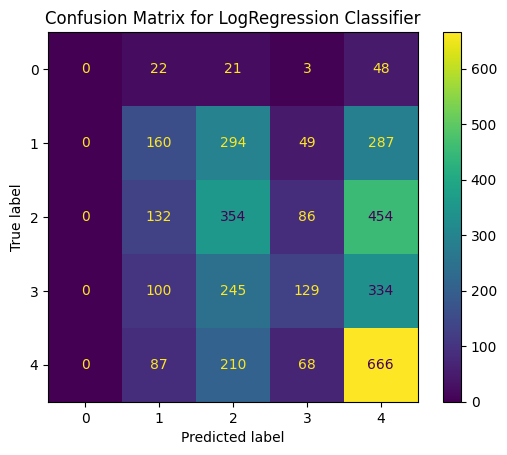

In [62]:
# predictions for test set

logreg_mul = logreg_mul.fit(X_train,Y_train)
y_test_pred = logreg_mul.predict(X_test)
plot_confusion_matrix(Y_test, y_test_pred, logreg_mul, name='LogRegression')

## Naive Bayes 

In [63]:
gnb_mul = GaussianNB()

gnb_mul

GaussianNB()

### Cross Validation

In [64]:
cross_validation(gnb_mul, "Naive Bayes", pa_mul_sup_task, X_train, Y_train)

Mean cross-validation accuracy in training: 34.79% +/- 0.33%
Mean cross-validation precision in training: 28.54% +/- 0.84%
Mean cross-validation recall in training: 28.58% +/- 0.33%
Mean cross-validation f1_score in training: 27.41% +/- 0.46%


Mean cross-validation accuracy in validation: 34.30% +/- 1.29%
Mean cross-validation precision in validation: 27.46% +/- 0.39%
Mean cross-validation recall in validation: 27.84% +/- 0.75%
Mean cross-validation f1_score in validation: 26.58% +/- 0.76%


### Confusion Matrix 


Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        94
           1       0.30      0.42      0.35       790
           2       0.33      0.27      0.29      1026
           3       0.34      0.17      0.23       808
           4       0.41      0.54      0.46      1031

    accuracy                           0.35      3749
   macro avg       0.27      0.28      0.27      3749
weighted avg       0.34      0.35      0.33      3749



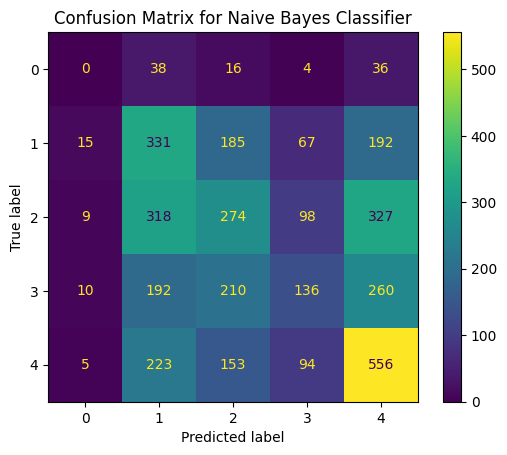

In [65]:
# predictions for test set

gnb_mul = gnb_mul.fit(X_train,Y_train)
y_test_pred = gnb_mul.predict(X_test)
plot_confusion_matrix(Y_test, y_test_pred, gnb_mul, name='Naive Bayes')

## Random Forest

In [66]:
rf_mul = RandomForestClassifier(random_state=0)

rf_mul

RandomForestClassifier(random_state=0)

### Random Forest Tuning

In [67]:
param_grid_rf = {
    'n_estimators': [50, 100, 200, 300],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

rf_mul = get_best_classifier(rf_mul, param_grid_rf, X_train, Y_train, table_X, table_Y)

Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best parameters for RandomForestClassifier: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}
Best cross-validation f1 score: 0.31
Nested CV Score: 0.32


### Cross Validation

In [68]:
cross_validation(rf_mul,"Random Forest", pa_mul_sup_task, X_train, Y_train)

Mean cross-validation accuracy in training: 94.98% +/- 3.24%
Mean cross-validation precision in training: 95.98% +/- 2.46%
Mean cross-validation recall in training: 92.29% +/- 6.39%
Mean cross-validation f1_score in training: 93.60% +/- 5.15%


Mean cross-validation accuracy in validation: 39.00% +/- 0.78%
Mean cross-validation precision in validation: 32.85% +/- 3.47%
Mean cross-validation recall in validation: 30.95% +/- 0.45%
Mean cross-validation f1_score in validation: 30.16% +/- 0.24%


### Confusion Matrix

Fitting 5 folds for each of 216 candidates, totalling 1080 fits


c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\joblib\externals\loky\process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(



Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.56      0.05      0.10        94
           1       0.38      0.33      0.35       790
           2       0.36      0.38      0.37      1026
           3       0.38      0.26      0.30       808
           4       0.47      0.66      0.55      1031

    accuracy                           0.41      3749
   macro avg       0.43      0.33      0.33      3749
weighted avg       0.40      0.41      0.39      3749



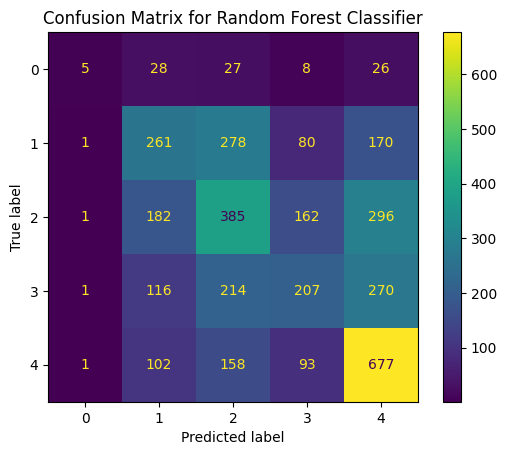

In [69]:
# predictions for test set

rf_mul = rf_mul.fit(X_train,Y_train)
y_test_pred = rf_mul.predict(X_test)
plot_confusion_matrix(Y_test, y_test_pred, rf_mul, name='Random Forest')

In [70]:
results.append(break_dict)

# 1.3 Train specialized models for cats and dogs

## 1.3.1 Predicting Adoption

### Create the dog and cat dataframes

In [71]:
#create dataframe for dogs
df_dog_bin = bin_df[bin_df['Type'] == 1]

#create dataframe for cats
df_cat_bin = bin_df[bin_df['Type'] == 2]

### Load data

In [72]:
table_X_dog, table_Y_dog, features, target_name = load_data(df_dog_bin)

table_X_cat, table_Y_cat, features, target_name = load_data(df_cat_bin)

### Split the sets

In [73]:
X_train_dog, X_test_dog, Y_train_dog, Y_test_dog = train_test_split(table_X_dog, table_Y_dog, random_state=0)

print(X_train_dog.shape)
print(X_test_dog.shape)

X_train_cat, X_test_cat, Y_train_cat, Y_test_cat = train_test_split(table_X_cat, table_Y_cat, random_state=0)

print(X_train_cat.shape)
print(X_test_cat.shape)

(6516, 15)
(2173, 15)
(5362, 15)
(1788, 15)


## KNN Classifier

In [74]:
knn_dog_bin = neighbors.KNeighborsClassifier(n_neighbors=4)

knn_cat_bin = neighbors.KNeighborsClassifier(n_neighbors=3)

### KNN Tuning

In [75]:
param_grid_knn = {
    'n_neighbors': range(3, 20, 2),  # Odd values from 3 to 19
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

knn_dog_bin = get_best_classifier(knn_dog_bin, param_grid_knn, X_train_dog, Y_train_dog, table_X_dog, table_Y_dog)
knn_cat_bin = get_best_classifier(knn_cat_bin, param_grid_knn, X_train_cat, Y_train_cat, table_X_cat, table_Y_cat)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\ma\core.py:2846: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Best parameters for KNeighborsClassifier: {'metric': 'manhattan', 'n_neighbors': 9, 'weights': 'distance'}
Best cross-validation f1 score: 0.74
Nested CV Score: 0.72
Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best parameters for KNeighborsClassifier: {'metric': 'manhattan', 'n_neighbors': 5, 'weights': 'distance'}
Best cross-validation f1 score: 0.69
Nested CV Score: 0.67


### Cross Validation

In [76]:
cross_validation(knn_dog_bin, "KNN Classifier", pa_bin_sup_dog_task, X_train_dog, Y_train_dog)
print('\n')
cross_validation(knn_cat_bin, "KNN Classifier",  pa_bin_sup_cat_task, X_train_cat, Y_train_cat)

Mean cross-validation accuracy in training: 98.46% +/- 0.07%
Mean cross-validation precision in training: 98.20% +/- 0.08%
Mean cross-validation recall in training: 98.65% +/- 0.06%
Mean cross-validation f1_score in training: 98.41% +/- 0.07%


Mean cross-validation accuracy in validation: 74.92% +/- 1.29%
Mean cross-validation precision in validation: 74.08% +/- 1.49%
Mean cross-validation recall in validation: 73.09% +/- 1.24%
Mean cross-validation f1_score in validation: 73.42% +/- 1.30%


Mean cross-validation accuracy in training: 99.69% +/- 0.05%
Mean cross-validation precision in training: 99.57% +/- 0.07%
Mean cross-validation recall in training: 99.75% +/- 0.04%
Mean cross-validation f1_score in training: 99.66% +/- 0.05%


Mean cross-validation accuracy in validation: 72.23% +/- 1.38%
Mean cross-validation precision in validation: 69.51% +/- 1.59%
Mean cross-validation recall in validation: 68.63% +/- 1.39%
Mean cross-validation f1_score in validation: 68.97% +/- 1.45%


### Confusion Matrix

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Fitting 5 folds for each of 36 candidates, totalling 180 fits

Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.70      0.66      0.68       826
           1       0.80      0.83      0.81      1347

    accuracy                           0.76      2173
   macro avg       0.75      0.74      0.75      2173
weighted avg       0.76      0.76      0.76      2173



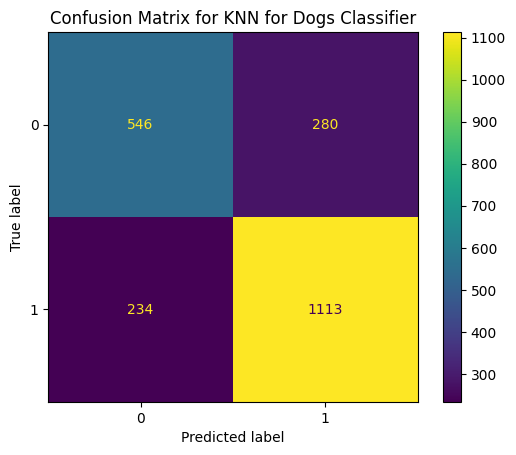


Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.63      0.59      0.61       600
           1       0.80      0.82      0.81      1188

    accuracy                           0.75      1788
   macro avg       0.72      0.71      0.71      1788
weighted avg       0.74      0.75      0.75      1788



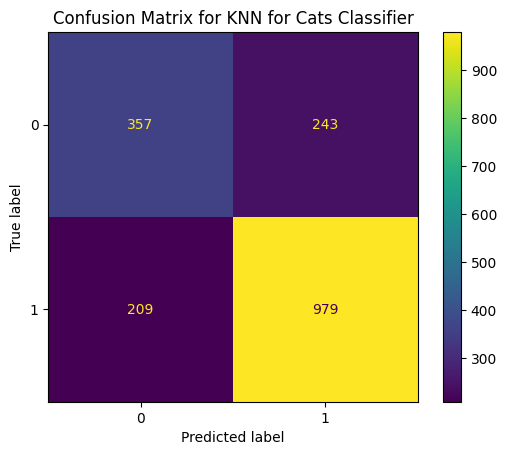

In [77]:
# predictions for dog test set
knn_dog_bin = knn_dog_bin.fit(X_train_dog, Y_train_dog)
y_test_pred_dog = knn_dog_bin.predict(X_test_dog)

# predictions for cat test set
knn_cat_bin = knn_cat_bin.fit(X_train_cat, Y_train_cat)
y_test_pred_cat = knn_cat_bin.predict(X_test_cat)

plot_confusion_matrix(Y_test_dog, y_test_pred_dog, knn_dog_bin, name='KNN for Dogs')
plot_confusion_matrix(Y_test_cat, y_test_pred_cat, knn_cat_bin, name='KNN for Cats')

## Decision Tree

In [78]:
dt_Cart_Gini_dog_bin = tree.DecisionTreeClassifier(random_state=0) # criterion = "Gini" by default

dt_Cart_Gini_cat_bin = tree.DecisionTreeClassifier(random_state=0) # criterion = "Gini" by default

### Decision Tree Tuning

In [79]:
param_grid_dt = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'auto', 'sqrt', 'log2']
}

dt_Cart_Gini_dog_bin = get_best_classifier(dt_Cart_Gini_dog_bin, param_grid_dt, X_train_dog, Y_train_dog, table_X_dog, table_Y_dog)
dt_Cart_Gini_cat_bin = get_best_classifier(dt_Cart_Gini_cat_bin, param_grid_dt, X_train_cat, Y_train_cat, table_X_cat, table_Y_cat)

Fitting 5 folds for each of 432 candidates, totalling 2160 fits


c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
540 fits failed out of a total of 2160.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
257 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\bas

Best parameters for DecisionTreeClassifier: {'criterion': 'gini', 'max_depth': 10, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 5}
Best cross-validation f1 score: 0.69
Nested CV Score: 0.70
Fitting 5 folds for each of 432 candidates, totalling 2160 fits
Best parameters for DecisionTreeClassifier: {'criterion': 'gini', 'max_depth': 10, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 5}
Best cross-validation f1 score: 0.67
Nested CV Score: 0.66


c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
540 fits failed out of a total of 2160.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
384 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\bas

### Cross-validation

In [80]:
cross_validation(dt_Cart_Gini_dog_bin, "Decision Tree", pa_bin_sup_dog_task, X_train_dog, Y_train_dog)
print('\n')
cross_validation(dt_Cart_Gini_cat_bin, "Decision Tree", pa_bin_sup_cat_task, X_train_cat, Y_train_cat)

Mean cross-validation accuracy in training: 79.48% +/- 0.84%
Mean cross-validation precision in training: 79.07% +/- 0.97%
Mean cross-validation recall in training: 77.71% +/- 0.79%
Mean cross-validation f1_score in training: 78.19% +/- 0.84%


Mean cross-validation accuracy in validation: 71.09% +/- 2.20%
Mean cross-validation precision in validation: 69.89% +/- 2.39%
Mean cross-validation recall in validation: 69.03% +/- 2.30%
Mean cross-validation f1_score in validation: 69.31% +/- 2.34%


Mean cross-validation accuracy in training: 80.16% +/- 1.63%
Mean cross-validation precision in training: 78.94% +/- 1.92%
Mean cross-validation recall in training: 76.63% +/- 1.98%
Mean cross-validation f1_score in training: 77.46% +/- 1.91%


Mean cross-validation accuracy in validation: 70.29% +/- 0.88%
Mean cross-validation precision in validation: 67.25% +/- 1.00%
Mean cross-validation recall in validation: 65.94% +/- 0.74%
Mean cross-validation f1_score in validation: 66.34% +/- 0.78%


### Confusion Matrix

Fitting 5 folds for each of 432 candidates, totalling 2160 fits


c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
540 fits failed out of a total of 2160.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
318 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\bas

Fitting 5 folds for each of 432 candidates, totalling 2160 fits

Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.67      0.60      0.63       826
           1       0.77      0.82      0.79      1347

    accuracy                           0.73      2173
   macro avg       0.72      0.71      0.71      2173
weighted avg       0.73      0.73      0.73      2173



c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
540 fits failed out of a total of 2160.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
415 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\bas

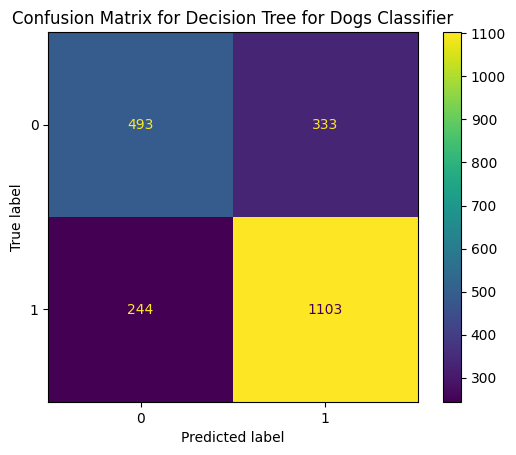


Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.55      0.53      0.54       600
           1       0.77      0.78      0.77      1188

    accuracy                           0.70      1788
   macro avg       0.66      0.65      0.65      1788
weighted avg       0.69      0.70      0.69      1788



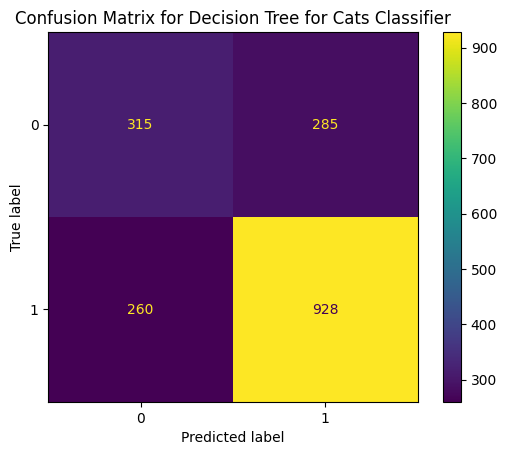

In [81]:
# Predictions for dog test set
dt_Cart_Gini_dog_bin = dt_Cart_Gini_dog_bin.fit(X_train_dog, Y_train_dog)
y_test_pred_dog = dt_Cart_Gini_dog_bin.predict(X_test_dog)

# Predictions for cat test set
dt_Cart_Gini_cat_bin = dt_Cart_Gini_cat_bin.fit(X_train_cat, Y_train_cat)
y_test_pred_cat = dt_Cart_Gini_cat_bin.predict(X_test_cat)

plot_confusion_matrix(Y_test_dog, y_test_pred_dog, dt_Cart_Gini_dog_bin, name='Decision Tree for Dogs')
plot_confusion_matrix(Y_test_cat, y_test_pred_cat, dt_Cart_Gini_cat_bin, name='Decision Tree for Cats')


## Logistic Regression

In [82]:
logreg_dog_bin = LogisticRegression(solver='liblinear')

logreg_cat_bin = LogisticRegression(solver='liblinear')

### Logistic Regression Tuning

In [83]:
param_grid_lr = {
    'penalty': ['l1', 'l2'],
    'C': [0.01, 0.1, 1, 10, 100],
    'solver': ['liblinear'],
    'max_iter': [100, 200, 300]
}

logreg_dog_bin = get_best_classifier(logreg_dog_bin, param_grid_lr, X_train_dog, Y_train_dog, table_X_dog, table_Y_dog)
logreg_cat_bin = get_best_classifier(logreg_cat_bin, param_grid_lr, X_train_cat, Y_train_cat, table_X_cat, table_Y_cat)

Fitting 5 folds for each of 30 candidates, totalling 150 fits
Best parameters for LogisticRegression: {'C': 10, 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear'}
Best cross-validation f1 score: 0.64
Nested CV Score: 0.56
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Best parameters for LogisticRegression: {'C': 10, 'max_iter': 300, 'penalty': 'l1', 'solver': 'liblinear'}
Best cross-validation f1 score: 0.55
Nested CV Score: 0.49


### Cross-validation

In [84]:
cross_validation(logreg_dog_bin, "Logistic Regression", pa_bin_sup_dog_task, X_train_dog, Y_train_dog)
print('\n')
cross_validation(logreg_cat_bin, "Logistic Regression", pa_bin_sup_cat_task, X_train_cat, Y_train_cat)

Mean cross-validation accuracy in training: 68.25% +/- 0.17%
Mean cross-validation precision in training: 67.74% +/- 0.26%
Mean cross-validation recall in training: 63.89% +/- 0.25%
Mean cross-validation f1_score in training: 63.89% +/- 0.32%


Mean cross-validation accuracy in validation: 67.83% +/- 0.78%
Mean cross-validation precision in validation: 67.18% +/- 0.99%
Mean cross-validation recall in validation: 63.47% +/- 0.87%
Mean cross-validation f1_score in validation: 63.44% +/- 0.97%


Mean cross-validation accuracy in training: 67.27% +/- 0.31%
Mean cross-validation precision in training: 64.46% +/- 0.58%
Mean cross-validation recall in training: 56.74% +/- 0.52%
Mean cross-validation f1_score in training: 54.78% +/- 0.80%


Mean cross-validation accuracy in validation: 67.10% +/- 0.57%
Mean cross-validation precision in validation: 64.15% +/- 1.41%
Mean cross-validation recall in validation: 56.50% +/- 0.60%
Mean cross-validation f1_score in validation: 54.42% +/- 0.74%


### Confusion Matrix

Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits

Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.62      0.39      0.48       826
           1       0.70      0.85      0.76      1347

    accuracy                           0.68      2173
   macro avg       0.66      0.62      0.62      2173
weighted avg       0.67      0.68      0.66      2173



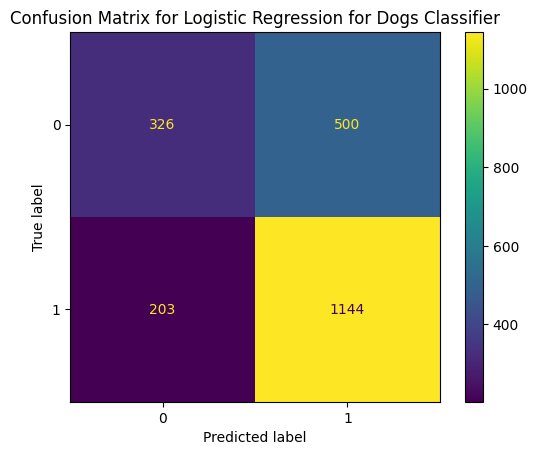


Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.59      0.23      0.33       600
           1       0.70      0.92      0.80      1188

    accuracy                           0.69      1788
   macro avg       0.64      0.57      0.56      1788
weighted avg       0.66      0.69      0.64      1788



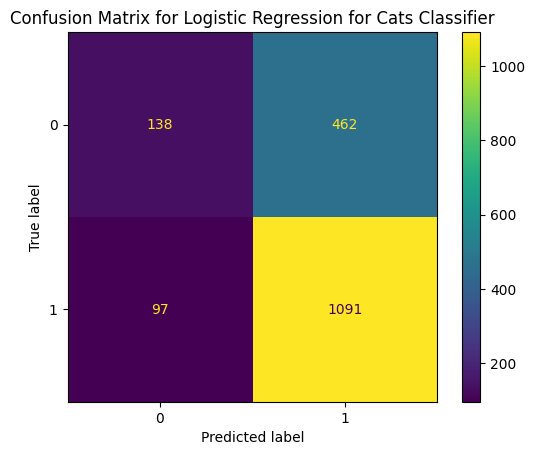

In [85]:
# predictions for dog test set
logreg_dog_bin = logreg_dog_bin.fit(X_train_dog, Y_train_dog)
y_test_pred_dog = logreg_dog_bin.predict(X_test_dog)

# predictions for cat test set
logreg_cat_bin = logreg_cat_bin.fit(X_train_cat, Y_train_cat)
y_test_pred_cat = logreg_cat_bin.predict(X_test_cat)

plot_confusion_matrix(Y_test_dog, y_test_pred_dog, logreg_dog_bin, name='Logistic Regression for Dogs')
plot_confusion_matrix(Y_test_cat, y_test_pred_cat, logreg_cat_bin, name='Logistic Regression for Cats')

## Naive Bayes

In [86]:
gnb_dog_bin = GaussianNB()

gnb_cat_bin = GaussianNB()

### Cross-validation

In [87]:
cross_validation(gnb_dog_bin, "Naive Bayes", pa_bin_sup_dog_task, X_train_dog, Y_train_dog)
print('\n')
cross_validation(gnb_cat_bin, "Naive Bayes", pa_bin_sup_cat_task, X_train_cat, Y_train_cat)

Mean cross-validation accuracy in training: 67.58% +/- 0.41%
Mean cross-validation precision in training: 66.09% +/- 0.45%
Mean cross-validation recall in training: 65.10% +/- 0.42%
Mean cross-validation f1_score in training: 65.33% +/- 0.42%


Mean cross-validation accuracy in validation: 67.25% +/- 1.38%
Mean cross-validation precision in validation: 65.75% +/- 1.54%
Mean cross-validation recall in validation: 64.76% +/- 1.21%
Mean cross-validation f1_score in validation: 64.99% +/- 1.26%


Mean cross-validation accuracy in training: 67.17% +/- 0.50%
Mean cross-validation precision in training: 63.12% +/- 0.67%
Mean cross-validation recall in training: 60.81% +/- 0.58%
Mean cross-validation f1_score in training: 61.10% +/- 0.63%


Mean cross-validation accuracy in validation: 66.65% +/- 0.77%
Mean cross-validation precision in validation: 62.43% +/- 1.07%
Mean cross-validation recall in validation: 60.23% +/- 1.05%
Mean cross-validation f1_score in validation: 60.45% +/- 1.17%


### Confusion Matrix


Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.61      0.53      0.57       826
           1       0.73      0.79      0.76      1347

    accuracy                           0.69      2173
   macro avg       0.67      0.66      0.67      2173
weighted avg       0.69      0.69      0.69      2173



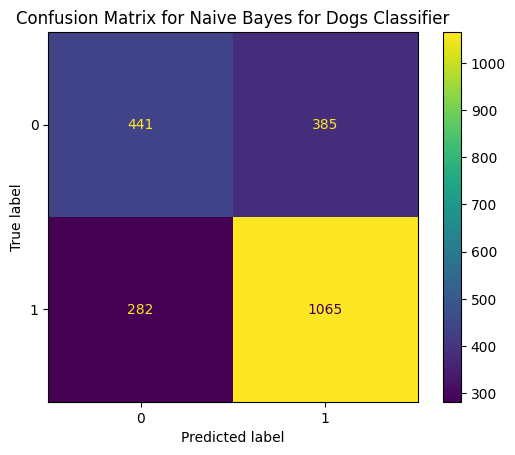


Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.53      0.41      0.46       600
           1       0.73      0.82      0.77      1188

    accuracy                           0.68      1788
   macro avg       0.63      0.61      0.62      1788
weighted avg       0.67      0.68      0.67      1788



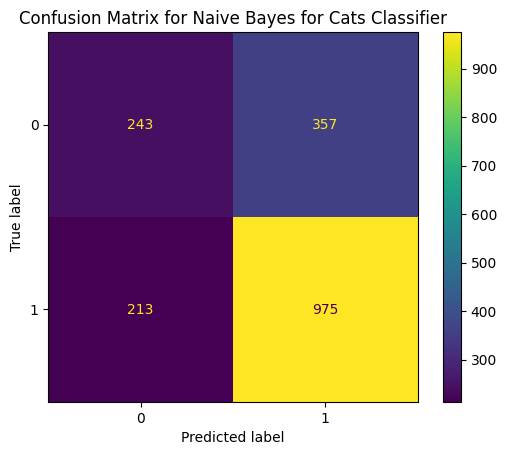

In [88]:
# predictions for dog test set
gnb_dog_bin = gnb_dog_bin.fit(X_train_dog, Y_train_dog)
y_test_pred_dog = gnb_dog_bin.predict(X_test_dog)

# predictions for cat test set
gnb_cat_bin = gnb_cat_bin.fit(X_train_cat, Y_train_cat)
y_test_pred_cat = gnb_cat_bin.predict(X_test_cat)

plot_confusion_matrix(Y_test_dog, y_test_pred_dog, gnb_dog_bin, name='Naive Bayes for Dogs')
plot_confusion_matrix(Y_test_cat, y_test_pred_cat, gnb_cat_bin, name='Naive Bayes for Cats')

## Random Forest

In [89]:
rf_dog_bin = RandomForestClassifier(random_state=0)

rf_cat_bin = RandomForestClassifier(random_state=0)

### Random Forest Tuning

In [90]:
param_grid_rf = {
    'n_estimators': [50, 100, 200, 300],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

rf_dog_bin = get_best_classifier(rf_dog_bin, param_grid_rf, X_train_dog, Y_train_dog, table_X_dog, table_Y_dog)
rf_cat_bin = get_best_classifier(rf_cat_bin, param_grid_rf, X_train_cat, Y_train_cat, table_X_cat, table_Y_cat)

Fitting 5 folds for each of 216 candidates, totalling 1080 fits


c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\ma\core.py:2846: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Best parameters for RandomForestClassifier: {'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Best cross-validation f1 score: 0.75
Nested CV Score: 0.75
Fitting 5 folds for each of 216 candidates, totalling 1080 fits


c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\ma\core.py:2846: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Best parameters for RandomForestClassifier: {'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Best cross-validation f1 score: 0.72
Nested CV Score: 0.72


### Cross-validation

In [91]:
cross_validation(rf_dog_bin, "Random Forest", pa_bin_sup_dog_task, X_train_dog, Y_train_dog)
print('\n')
cross_validation(rf_cat_bin, "Random Forest", pa_bin_sup_cat_task, X_train_cat, Y_train_cat)

Mean cross-validation accuracy in training: 96.42% +/- 1.07%
Mean cross-validation precision in training: 96.54% +/- 1.05%
Mean cross-validation recall in training: 96.02% +/- 1.19%
Mean cross-validation f1_score in training: 96.26% +/- 1.13%


Mean cross-validation accuracy in validation: 76.03% +/- 2.03%
Mean cross-validation precision in validation: 75.33% +/- 2.30%
Mean cross-validation recall in validation: 74.10% +/- 1.97%
Mean cross-validation f1_score in validation: 74.52% +/- 2.06%


Mean cross-validation accuracy in training: 99.69% +/- 0.05%
Mean cross-validation precision in training: 99.68% +/- 0.05%
Mean cross-validation recall in training: 99.64% +/- 0.06%
Mean cross-validation f1_score in training: 99.66% +/- 0.06%


Mean cross-validation accuracy in validation: 75.66% +/- 1.06%
Mean cross-validation precision in validation: 73.86% +/- 1.23%
Mean cross-validation recall in validation: 70.95% +/- 1.37%
Mean cross-validation f1_score in validation: 71.82% +/- 1.39%


### Confusion Matrix

Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Fitting 5 folds for each of 216 candidates, totalling 1080 fits

Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.72      0.65      0.68       826
           1       0.80      0.84      0.82      1347

    accuracy                           0.77      2173
   macro avg       0.76      0.75      0.75      2173
weighted avg       0.77      0.77      0.77      2173



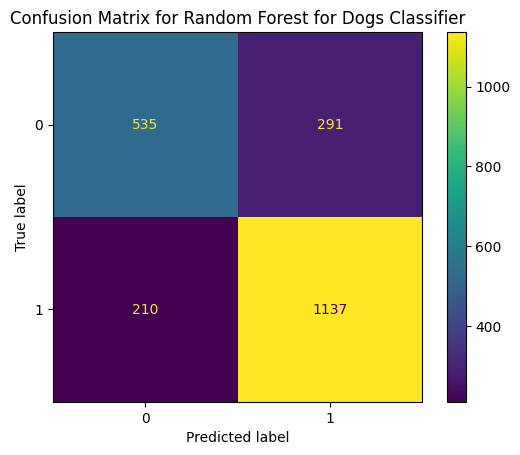


Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.67      0.62      0.65       600
           1       0.82      0.85      0.83      1188

    accuracy                           0.77      1788
   macro avg       0.75      0.74      0.74      1788
weighted avg       0.77      0.77      0.77      1788



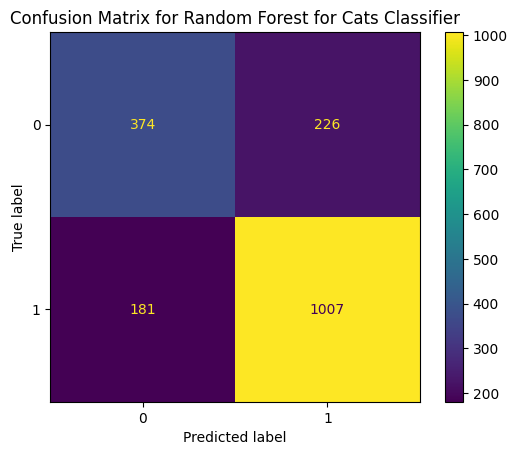

In [92]:
# predictions for dog test set
rf_dog_bin = rf_dog_bin.fit(X_train_dog, Y_train_dog)
y_test_pred_dog = rf_dog_bin.predict(X_test_dog)

# predictions for cat test set
rf_cat_bin = rf_cat_bin.fit(X_train_cat, Y_train_cat)
y_test_pred_cat = rf_cat_bin.predict(X_test_cat)

plot_confusion_matrix(Y_test_dog, y_test_pred_dog, rf_dog_bin, name='Random Forest for Dogs')
plot_confusion_matrix(Y_test_cat, y_test_pred_cat, rf_cat_bin, name='Random Forest for Cats')

## 1.3.2 Predicting AdoptionSpeed

### Create the dog and cat dataframes

In [93]:
#create dataframe for dogs
df_dog_mul = df[df['Type'] == 1]

#create dataframe for cats
df_cat_mul = df[df['Type'] == 2]


### Load data

In [94]:
table_X_dog, table_Y_dog, features, target_name = load_data(df_dog_mul)

table_X_cat, table_Y_cat, features, target_name = load_data(df_cat_mul)

### Split the sets

In [95]:
X_train_dog, X_test_dog, Y_train_dog, Y_test_dog = train_test_split(table_X_dog, table_Y_dog, random_state=0)

print(X_train_dog.shape)
print(X_test_dog.shape)

X_train_cat, X_test_cat, Y_train_cat, Y_test_cat = train_test_split(table_X_cat, table_Y_cat, random_state=0)

print(X_train_cat.shape)
print(X_test_cat.shape)

(6099, 15)
(2033, 15)
(5145, 15)
(1716, 15)


## KNN Classifier

In [96]:
knn_dog_mul = neighbors.KNeighborsClassifier(n_neighbors=3)

knn_cat_mul = neighbors.KNeighborsClassifier(n_neighbors=3)

### KNN Tuning

In [97]:
param_grid_knn = {
    'n_neighbors': range(3, 20, 2),  # Odd values from 3 to 19
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

knn_dog_mul = get_best_classifier(knn_dog_mul, param_grid_knn, X_train_dog, Y_train_dog, table_X_dog, table_Y_dog)
knn_cat_mul = get_best_classifier(knn_cat_mul, param_grid_knn, X_train_cat, Y_train_cat, table_X_cat, table_Y_cat)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best parameters for KNeighborsClassifier: {'metric': 'manhattan', 'n_neighbors': 17, 'weights': 'distance'}
Best cross-validation f1 score: 0.30
Nested CV Score: 0.28
Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best parameters for KNeighborsClassifier: {'metric': 'euclidean', 'n_neighbors': 11, 'weights': 'distance'}
Best cross-validation f1 score: 0.28
Nested CV Score: 0.24


### Cross-validation

In [98]:
cross_validation(knn_dog_mul, "KNN Classifier", pa_mul_sup_dog_task, X_train_dog, Y_train_dog)
print('\n')
cross_validation(knn_cat_mul, "KNN Classifier", pa_mul_sup_cat_task, X_train_cat, Y_train_cat)

Mean cross-validation accuracy in training: 96.97% +/- 0.13%
Mean cross-validation precision in training: 96.35% +/- 0.36%
Mean cross-validation recall in training: 97.29% +/- 0.16%
Mean cross-validation f1_score in training: 96.79% +/- 0.19%


Mean cross-validation accuracy in validation: 37.74% +/- 1.04%
Mean cross-validation precision in validation: 33.06% +/- 1.62%
Mean cross-validation recall in validation: 30.24% +/- 0.87%
Mean cross-validation f1_score in validation: 30.36% +/- 0.84%


Mean cross-validation accuracy in training: 99.27% +/- 0.07%
Mean cross-validation precision in training: 99.10% +/- 0.17%
Mean cross-validation recall in training: 99.40% +/- 0.06%
Mean cross-validation f1_score in training: 99.25% +/- 0.12%


Mean cross-validation accuracy in validation: 33.53% +/- 1.25%
Mean cross-validation precision in validation: 32.33% +/- 7.54%
Mean cross-validation recall in validation: 27.36% +/- 1.25%
Mean cross-validation f1_score in validation: 27.18% +/- 1.42%


### Confusion Matrix

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Fitting 5 folds for each of 36 candidates, totalling 180 fits

Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.17      0.02      0.04        43
           1       0.31      0.35      0.33       345
           2       0.38      0.37      0.38       582
           3       0.35      0.30      0.32       495
           4       0.48      0.55      0.51       568

    accuracy                           0.39      2033
   macro avg       0.34      0.32      0.32      2033
weighted avg       0.39      0.39      0.39      2033



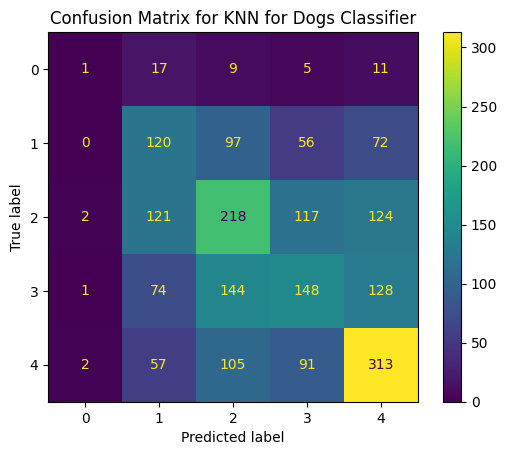


Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.33      0.06      0.10        66
           1       0.32      0.37      0.34       419
           2       0.32      0.34      0.33       474
           3       0.26      0.17      0.20       329
           4       0.40      0.47      0.44       428

    accuracy                           0.34      1716
   macro avg       0.33      0.28      0.28      1716
weighted avg       0.33      0.34      0.33      1716



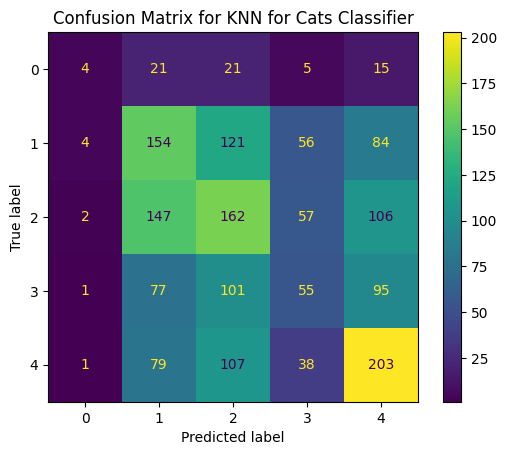

In [99]:
# predictions for dog test set
knn_dog_mul = knn_dog_mul.fit(X_train_dog, Y_train_dog)
y_test_pred_dog = knn_dog_mul.predict(X_test_dog)

# predictions for cat test set
knn_cat_mul = knn_cat_mul.fit(X_train_cat, Y_train_cat)
y_test_pred_cat = knn_cat_mul.predict(X_test_cat)

plot_confusion_matrix(Y_test_dog, y_test_pred_dog, knn_dog_mul, name= 'KNN for Dogs')
plot_confusion_matrix(Y_test_cat, y_test_pred_cat, knn_cat_mul, name= 'KNN for Cats')

## Decision Tree

In [100]:
dt_Cart_Gini_dog_mul = tree.DecisionTreeClassifier(random_state=0) # criterion = "Gini" by default

dt_Cart_Gini_cat_mul = tree.DecisionTreeClassifier(random_state=0) # criterion = "Gini" by default

### Decision Tree Tuning

In [101]:
param_grid_dt = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}

dt_Cart_Gini_dog_mul = get_best_classifier(dt_Cart_Gini_dog_mul, param_grid_dt, X_train_dog, Y_train_dog, table_X_dog, table_Y_dog)
dt_Cart_Gini_cat_mul = get_best_classifier(dt_Cart_Gini_cat_mul, param_grid_dt, X_train_cat, Y_train_cat, table_X_cat, table_Y_cat)

Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best parameters for DecisionTreeClassifier: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 10}
Best cross-validation f1 score: 0.29
Nested CV Score: 0.28
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best parameters for DecisionTreeClassifier: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best cross-validation f1 score: 0.27
Nested CV Score: 0.26


### Cross-validation

In [102]:
cross_validation(dt_Cart_Gini_dog_mul, "Decision Tree", pa_mul_sup_dog_task, X_train_dog, Y_train_dog)
print('\n')
cross_validation(dt_Cart_Gini_cat_mul, "Decision Tree", pa_mul_sup_cat_task, X_train_cat, Y_train_cat)

Mean cross-validation accuracy in training: 55.68% +/- 4.86%
Mean cross-validation precision in training: 56.61% +/- 3.59%
Mean cross-validation recall in training: 48.23% +/- 5.88%
Mean cross-validation f1_score in training: 49.70% +/- 5.59%


Mean cross-validation accuracy in validation: 36.53% +/- 1.85%
Mean cross-validation precision in validation: 29.87% +/- 2.08%
Mean cross-validation recall in validation: 29.10% +/- 1.49%
Mean cross-validation f1_score in validation: 29.10% +/- 1.62%


Mean cross-validation accuracy in training: 59.48% +/- 7.93%
Mean cross-validation precision in training: 59.70% +/- 4.65%
Mean cross-validation recall in training: 54.14% +/- 9.19%
Mean cross-validation f1_score in training: 54.81% +/- 8.38%


Mean cross-validation accuracy in validation: 31.90% +/- 1.50%
Mean cross-validation precision in validation: 26.24% +/- 0.49%
Mean cross-validation recall in validation: 26.11% +/- 0.53%
Mean cross-validation f1_score in validation: 25.73% +/- 0.62%


### Confusion Matrix

Fitting 5 folds for each of 72 candidates, totalling 360 fits
Fitting 5 folds for each of 72 candidates, totalling 360 fits

Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.08      0.02      0.04        43
           1       0.33      0.32      0.33       345
           2       0.37      0.40      0.38       582
           3       0.39      0.28      0.32       495
           4       0.50      0.61      0.55       568

    accuracy                           0.41      2033
   macro avg       0.33      0.33      0.32      2033
weighted avg       0.40      0.41      0.40      2033



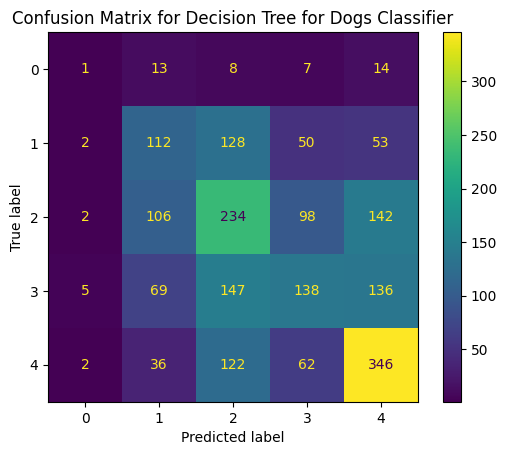


Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.11      0.02      0.03        66
           1       0.33      0.34      0.33       419
           2       0.31      0.37      0.34       474
           3       0.25      0.14      0.18       329
           4       0.39      0.50      0.44       428

    accuracy                           0.34      1716
   macro avg       0.28      0.27      0.26      1716
weighted avg       0.32      0.34      0.32      1716



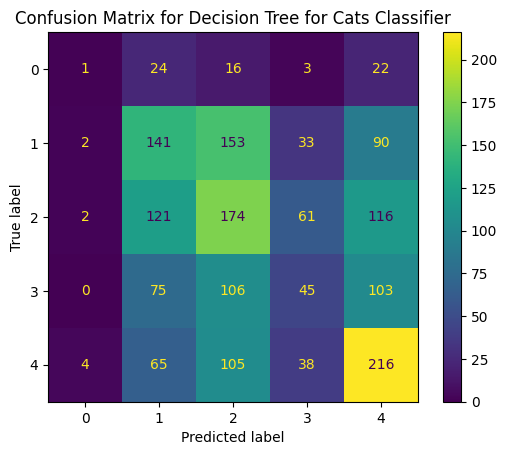

In [103]:
# predictions for test set
dt_Cart_Gini_dog_mul = dt_Cart_Gini_dog_mul.fit(X_train_dog, Y_train_dog)
y_test_pred_dog = dt_Cart_Gini_dog_mul.predict(X_test_dog)

# predictions for test set
dt_Cart_Gini_cat_mul = dt_Cart_Gini_cat_mul.fit(X_train_cat, Y_train_cat)
y_test_pred_cat = dt_Cart_Gini_cat_mul.predict(X_test_cat)

plot_confusion_matrix(Y_test_dog, y_test_pred_dog, dt_Cart_Gini_dog_mul, name='Decision Tree for Dogs')
plot_confusion_matrix(Y_test_cat, y_test_pred_cat, dt_Cart_Gini_cat_mul, name='Decision Tree for Cats')

## Logistic Regression

In [104]:
logreg_dog_mul = LogisticRegression(solver='liblinear')

logreg_cat_mul = LogisticRegression(solver='liblinear')

### Logistic Regression Tuning

In [105]:
param_grid_lr_multiclass = {
    'penalty': ['none', 'l2'],
    'C': [0.01, 0.1, 1, 10, 100],
    'solver': ['newton-cg', 'lbfgs', 'sag', 'saga'],
    'max_iter': [100, 200, 300],
    'multi_class': ['ovr', 'multinomial']
}

logreg_dog_mul = get_best_classifier(logreg_dog_mul, param_grid_lr_multiclass, X_train_dog, Y_train_dog, table_X_dog, table_Y_dog)
logreg_cat_mul = get_best_classifier(logreg_cat_mul, param_grid_lr_multiclass, X_train_cat, Y_train_cat, table_X_cat, table_Y_cat)

Fitting 5 folds for each of 240 candidates, totalling 1200 fits


c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
600 fits failed out of a total of 1200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
107 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\bas

Best parameters for LogisticRegression: {'C': 100, 'max_iter': 100, 'multi_class': 'ovr', 'penalty': 'l2', 'solver': 'newton-cg'}
Best cross-validation f1 score: 0.25
Nested CV Score: 0.17
Fitting 5 folds for each of 240 candidates, totalling 1200 fits


c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
600 fits failed out of a total of 1200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
190 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\bas

Best parameters for LogisticRegression: {'C': 1, 'max_iter': 100, 'multi_class': 'multinomial', 'penalty': 'l2', 'solver': 'newton-cg'}
Best cross-validation f1 score: 0.25
Nested CV Score: 0.20


### Cross-validation

In [106]:
cross_validation(logreg_dog_mul, "Logistic Regression", pa_mul_sup_dog_task, X_train_dog, Y_train_dog)
print('\n')
cross_validation(logreg_cat_mul, "Logistic Regression", pa_mul_sup_cat_task, X_train_cat, Y_train_cat)

Mean cross-validation accuracy in training: 36.53% +/- 0.46%
Mean cross-validation precision in training: 28.23% +/- 0.46%
Mean cross-validation recall in training: 27.14% +/- 0.39%
Mean cross-validation f1_score in training: 25.33% +/- 0.45%


Mean cross-validation accuracy in validation: 36.35% +/- 1.13%
Mean cross-validation precision in validation: 27.93% +/- 0.98%
Mean cross-validation recall in validation: 27.00% +/- 0.74%
Mean cross-validation f1_score in validation: 25.11% +/- 0.61%


Mean cross-validation accuracy in training: 35.23% +/- 0.59%
Mean cross-validation precision in training: 27.61% +/- 0.43%
Mean cross-validation recall in training: 27.38% +/- 0.46%
Mean cross-validation f1_score in training: 25.10% +/- 0.62%


Mean cross-validation accuracy in validation: 33.80% +/- 1.66%
Mean cross-validation precision in validation: 26.87% +/- 2.25%
Mean cross-validation recall in validation: 26.28% +/- 1.27%
Mean cross-validation f1_score in validation: 24.23% +/- 1.01%


### Confusion Matrix

Fitting 5 folds for each of 240 candidates, totalling 1200 fits


c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
600 fits failed out of a total of 1200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
149 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\bas

Fitting 5 folds for each of 240 candidates, totalling 1200 fits


c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
600 fits failed out of a total of 1200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
146 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\bas


Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        43
           1       0.33      0.18      0.23       345
           2       0.37      0.25      0.30       582
           3       0.43      0.21      0.28       495
           4       0.37      0.79      0.50       568

    accuracy                           0.37      2033
   macro avg       0.30      0.28      0.26      2033
weighted avg       0.37      0.37      0.33      2033



c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

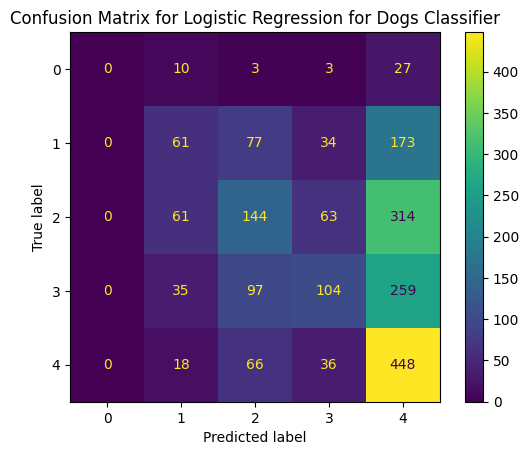


Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        66
           1       0.27      0.27      0.27       419
           2       0.33      0.41      0.37       474
           3       0.41      0.08      0.13       329
           4       0.35      0.54      0.43       428

    accuracy                           0.33      1716
   macro avg       0.27      0.26      0.24      1716
weighted avg       0.33      0.33      0.30      1716



c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

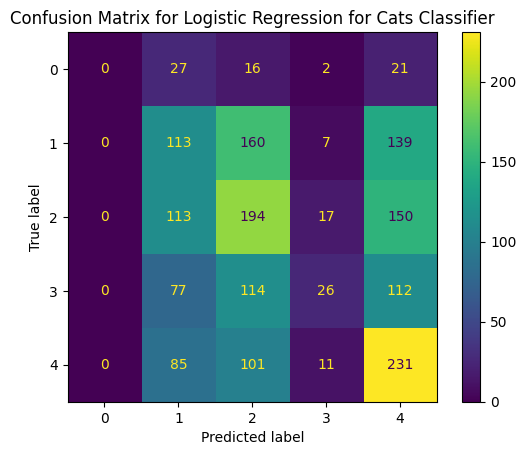

In [107]:
# predictions for dog test set
logreg_dog_mul = logreg_dog_mul.fit(X_train_dog, Y_train_dog)
y_test_pred_dog = logreg_dog_mul.predict(X_test_dog)

# predictions for cat test set
logreg_cat_mul = logreg_cat_mul.fit(X_train_cat, Y_train_cat)
y_test_pred_cat = logreg_cat_mul.predict(X_test_cat)

plot_confusion_matrix(Y_test_dog, y_test_pred_dog, logreg_dog_mul, name='Logistic Regression for Dogs')
plot_confusion_matrix(Y_test_cat, y_test_pred_cat, logreg_cat_mul, name='Logistic Regression for Cats')

## Naive Bayes

In [108]:
gnb_dog_mul = GaussianNB()

gnb_cat_mul = GaussianNB()

### Cross-validation

In [109]:
cross_validation(gnb_dog_mul, "Naive Bayes", pa_mul_sup_dog_task, X_train_dog, Y_train_dog)
print('\n')
cross_validation(gnb_cat_mul, "Naive Bayes", pa_mul_sup_cat_task, X_train_cat, Y_train_cat)

Mean cross-validation accuracy in training: 36.26% +/- 0.28%
Mean cross-validation precision in training: 28.63% +/- 0.40%
Mean cross-validation recall in training: 28.69% +/- 0.60%
Mean cross-validation f1_score in training: 28.10% +/- 0.73%


Mean cross-validation accuracy in validation: 35.53% +/- 1.12%
Mean cross-validation precision in validation: 27.65% +/- 1.11%
Mean cross-validation recall in validation: 27.78% +/- 0.82%
Mean cross-validation f1_score in validation: 27.16% +/- 0.74%


Mean cross-validation accuracy in training: 33.54% +/- 0.53%
Mean cross-validation precision in training: 32.26% +/- 1.50%
Mean cross-validation recall in training: 28.74% +/- 0.24%
Mean cross-validation f1_score in training: 26.35% +/- 0.38%


Mean cross-validation accuracy in validation: 32.89% +/- 2.06%
Mean cross-validation precision in validation: 31.57% +/- 2.74%
Mean cross-validation recall in validation: 28.21% +/- 1.93%
Mean cross-validation f1_score in validation: 25.85% +/- 2.43%


### Confusion Matrix


Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        43
           1       0.30      0.30      0.30       345
           2       0.35      0.26      0.30       582
           3       0.36      0.27      0.31       495
           4       0.41      0.62      0.49       568

    accuracy                           0.36      2033
   macro avg       0.29      0.29      0.28      2033
weighted avg       0.36      0.36      0.35      2033



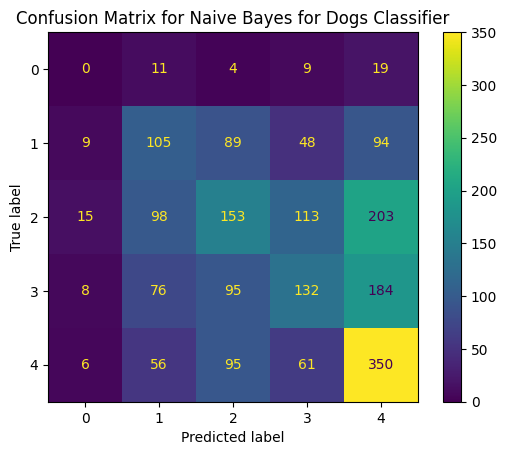


Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.05      0.02      0.02        66
           1       0.28      0.64      0.39       419
           2       0.30      0.10      0.15       474
           3       0.35      0.14      0.20       329
           4       0.38      0.40      0.39       428

    accuracy                           0.31      1716
   macro avg       0.27      0.26      0.23      1716
weighted avg       0.32      0.31      0.27      1716



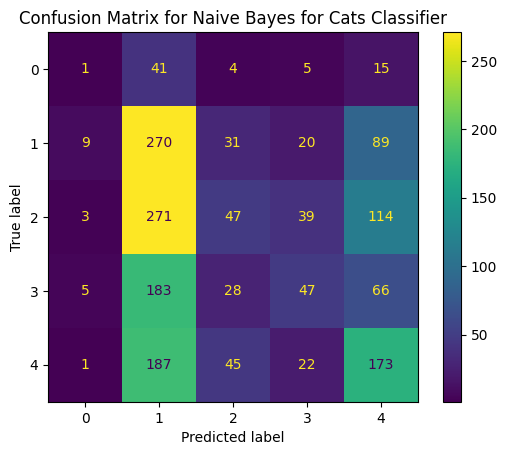

In [110]:
# predictions for dog test set
gnb_dog_mul = gnb_dog_mul.fit(X_train_dog, Y_train_dog)
y_test_pred_dog = gnb_dog_mul.predict(X_test_dog)

# predictions for cat test set
gnb_cat_mul = gnb_cat_mul.fit(X_train_cat, Y_train_cat)
y_test_pred_cat = gnb_cat_mul.predict(X_test_cat)

plot_confusion_matrix(Y_test_dog, y_test_pred_dog, gnb_dog_mul, name='Naive Bayes for Dogs')
plot_confusion_matrix(Y_test_cat, y_test_pred_cat, gnb_cat_mul, name='Naive Bayes for Cats')

## Random Forest

In [111]:
rf_dog_mul = RandomForestClassifier(random_state=0)

rf_cat_mul = RandomForestClassifier(random_state=0)

### Random Forest Tuning

In [112]:
param_grid_rf = {
    'n_estimators': [50, 100, 200, 300],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

rf_dog_mul = get_best_classifier(rf_dog_mul, param_grid_rf, X_train_dog, Y_train_dog, table_X_dog, table_Y_dog)
rf_cat_mul = get_best_classifier(rf_cat_mul, param_grid_rf, X_train_cat, Y_train_cat, table_X_cat, table_Y_cat)

Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best parameters for RandomForestClassifier: {'criterion': 'entropy', 'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 300}
Best cross-validation f1 score: 0.33
Nested CV Score: 0.32
Fitting 5 folds for each of 216 candidates, totalling 1080 fits


c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\ma\core.py:2846: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Best parameters for RandomForestClassifier: {'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 300}
Best cross-validation f1 score: 0.30
Nested CV Score: 0.30


### Cross-validation

In [113]:
cross_validation(rf_dog_mul, "Random Forest", pa_mul_sup_dog_task, X_train_dog, Y_train_dog)
print('\n')
cross_validation(rf_cat_mul, "Random Forest", pa_mul_sup_cat_task, X_train_cat, Y_train_cat)

Mean cross-validation accuracy in training: 92.25% +/- 3.36%
Mean cross-validation precision in training: 93.93% +/- 2.40%
Mean cross-validation recall in training: 88.00% +/- 6.14%
Mean cross-validation f1_score in training: 90.18% +/- 5.09%


Mean cross-validation accuracy in validation: 42.02% +/- 0.99%
Mean cross-validation precision in validation: 38.53% +/- 6.84%
Mean cross-validation recall in validation: 32.78% +/- 0.78%
Mean cross-validation f1_score in validation: 32.53% +/- 0.84%


Mean cross-validation accuracy in training: 99.15% +/- 0.20%
Mean cross-validation precision in training: 99.23% +/- 0.17%
Mean cross-validation recall in training: 99.06% +/- 0.30%
Mean cross-validation f1_score in training: 99.14% +/- 0.23%


Mean cross-validation accuracy in validation: 37.43% +/- 0.62%
Mean cross-validation precision in validation: 33.73% +/- 1.89%
Mean cross-validation recall in validation: 30.75% +/- 0.72%
Mean cross-validation f1_score in validation: 30.44% +/- 1.04%


### Confusion Matrix

Fitting 5 folds for each of 216 candidates, totalling 1080 fits


c:\Users\helto\AppData\Local\Programs\Python\Python312\Lib\site-packages\joblib\externals\loky\process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Fitting 5 folds for each of 216 candidates, totalling 1080 fits

Classification Report for Test Set:
              precision    recall  f1-score   support

           0       1.00      0.02      0.05        43
           1       0.36      0.34      0.35       345
           2       0.40      0.34      0.37       582
           3       0.40      0.32      0.35       495
           4       0.48      0.70      0.57       568

    accuracy                           0.43      2033
   macro avg       0.53      0.34      0.34      2033
weighted avg       0.43      0.43      0.41      2033



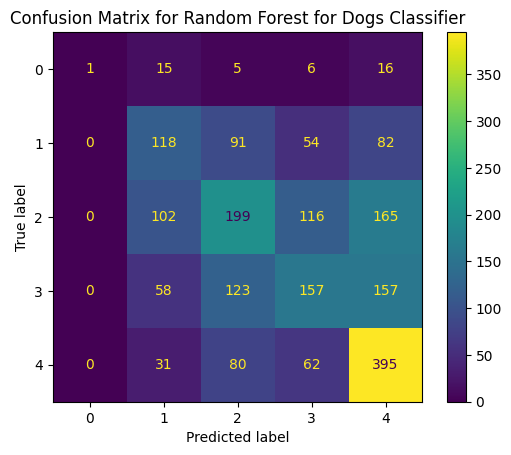


Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.20      0.02      0.03        66
           1       0.36      0.37      0.36       419
           2       0.34      0.34      0.34       474
           3       0.31      0.17      0.22       329
           4       0.43      0.62      0.51       428

    accuracy                           0.37      1716
   macro avg       0.33      0.30      0.29      1716
weighted avg       0.36      0.37      0.35      1716



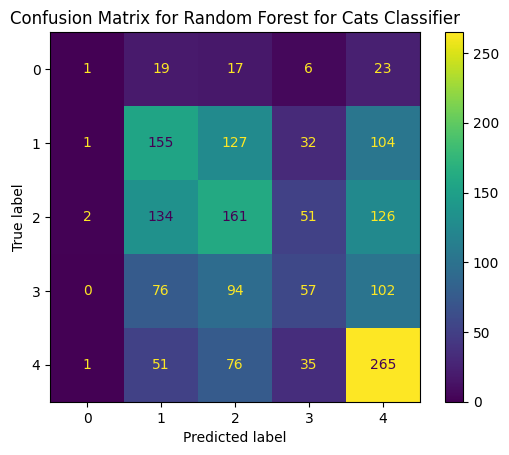

In [114]:
# predictions for dog test set
rf_dog_mul = rf_dog_mul.fit(X_train_dog, Y_train_dog)
y_test_pred_dog = rf_dog_mul.predict(X_test_dog)

# predictions for cat test set
rf_cat_mul = rf_cat_mul.fit(X_train_cat, Y_train_cat)
y_test_pred_cat = rf_cat_mul.predict(X_test_cat)

plot_confusion_matrix(Y_test_dog, y_test_pred_dog, rf_dog_mul, name='Random Forest for Dogs')
plot_confusion_matrix(Y_test_cat, y_test_pred_cat, rf_cat_mul, name='Random Forest for Cats')

# Results

In [115]:
results_df = pd.DataFrame(results)
results_df

,Model,Task,Accuracy,Precision,Recall,F1 Score,F1-Score
0,KNN Classifier,Predicting Adoption (Binary) - Supervised,74.37% +/- 0.63%,72.75% +/- 0.73%,71.39% +/- 0.66%,71.87% +/- 0.67%,NaN
1,KNN Classifier,Predicting Adoption (Binary) - Supervised,74.37% +/- 0.63%,72.75% +/- 0.73%,71.39% +/- 0.66%,71.87% +/- 0.67%,NaN
2,Decision Tree,Predicting Adoption (Binary) - Supervised,71.77% +/- 0.59%,69.89% +/- 0.68%,68.01% +/- 0.81%,68.52% +/- 0.80%,NaN
3,Decision Tree,Predicting Adoption (Binary) - Supervised,71.77% +/- 0.59%,69.89% +/- 0.68%,68.01% +/- 0.81%,68.52% +/- 0.80%,NaN
4,Logistic Regression,Predicting Adoption (Binary) - Supervised,67.30% +/- 0.94%,65.85% +/- 1.71%,59.66% +/- 1.05%,58.82% +/- 1.30%,NaN
5,Naive Bayes,Predicting Adoption (Binary) - Supervised,66.76% +/- 0.96%,64.16% +/- 0.99%,63.27% +/- 0.50%,63.51% +/- 0.57%,NaN
6,Random Forest,Predicting Adoption (Binary) - Supervised,75.80% +/- 0.41%,74.47% +/- 0.44%,72.63% +/- 0.60%,73.24% +/- 0.55%,NaN
7,,----,,,,NaN,
8,KNN Classifier,Predicting Adoption (Multiclass) - Supervised,36.34% +/- 1.11%,30.92% +/- 1.54%,29.56% +/- 0.64%,29.39% +/- 0.54%,NaN
9,Decision Tree,Predicting Adoption (Multiclass) - Supervised,36.21% +/- 1.09%,30.08% +/- 2.14%,28.97% +/- 1.00%,28.40% +/- 1.03%,NaN


# Discussion

**Binary Class Prediction:**

Random Forest:

This model consistently achieved the highest scores across all metrics (Accuracy: 75.80%, F1 Score: 73.24%), indicating its strong performance in both precision and recall. This suggests that the model is well-suited for identifying patterns that distinguish between adopted and non-adopted instances.
The low standard deviations indicate stability in performance across folds.

KNN Classifier:

While performing slightly lower than Random Forest (Accuracy: 74.37%, F1 Score: 71.87%), it remains competitive. Its strong recall (71.39%) highlights its ability to identify true positive cases, though precision lags slightly behind.

Decision Tree:

Although simpler than Random Forest, the Decision Tree performed reasonably well (F1 Score: 68.52%) but fell short due to slightly lower precision and recall.

Logistic Regression and Naive Bayes:

These models struggled relative to tree-based methods (F1 Scores: 58.82% and 63.51%, respectively). Logistic Regression's low recall suggests difficulty capturing nuances in the data, while Naive Bayes showed more balance but still lagged behind.

**Multiclass Prediction:** 

Random Forest:

Random Forest outperformed other models here as well, with an F1 Score of 30.16%. While this is relatively low, it reflects the challenges of a multiclass setting with potentially imbalanced class distributions.
The variance in precision suggests some instability in distinguishing less frequent classes.

KNN Classifier:

Achieved an F1 Score of 29.39%, demonstrating some capacity for multiclass classification, though it did not match Random Forest's performance.


Decision Tree, Logistic Regression, and Naive Bayes all struggled, with F1 Scores between 24-28%. This highlights the difficulty of multiclass classification, particularly with simple or linear models.

**Binary Prediction: Dogs and Cats**

Dogs:

Random Forest showed superior performance (Accuracy: 76.03%, F1 Score: 74.52%), maintaining its leading position across tasks. It captured the nuances of dog adoption cases effectively, with high precision and recall.
KNN Classifier followed closely (F1 Score: 73.42%), emphasizing its ability to handle binary classification with well-separated classes.

Cats:

Performance was slightly lower for cats compared to dogs across all models, with Random Forest still leading (Accuracy: 75.66%, F1 Score: 71.82%).
The Decision Tree and KNN Classifier also performed well, but their metrics suggest the task of predicting cat adoption may involve more subtle distinctions, which linear models struggled to capture.

**Multiclass Prediction: Dogs and Cats**

Dogs:

Random Forest performed the best (F1 Score: 32.53%), albeit with significant variation in precision, reflecting the added complexity of distinguishing between multiple classes.
The KNN Classifier and Decision Tree showed modest performance but struggled with precision and recall.

Cats:

Performance was generally lower than for dogs. Random Forest again led the pack (F1 Score: 33.73%), but its precision and recall differences suggest greater class imbalances or feature complexities in the dataset for cats.
Other models like Naive Bayes and Logistic Regression struggled to exceed an F1 Score of 26%, indicating difficulty in capturing the complexity of this task.


**Conclusions on the results:**

Random Forest consistently outperformed other models, particularly in binary classification tasks, due to its ensemble nature and ability to capture complex feature interactions, so we considered it the best model in our case, followed then by KNN. This is to be expected, because when we were studying the top ranked models on the original Kaggle competition, we found that the best models were usually more complex ensemble models or even Neural Networks. So in order to better improve results we could try these more sophisticated models next.

Naive Bayes, Logistic Regression, and Decision Tree (to a lesser extent) showed signs of underfitting with moderate metrics for both training and testing. KNN and Random Forest seemed to overfit, with near-perfect training metrics but lower testing performance in binary classification. The same scenarios happened in multiclass classification but to a even greater magnitude.

This likely reflects imbalanced classes, overlapping features, or insufficient distinct patterns specific to each class in the data. Applying SMOTENC to these classes could of also helped but, in general we believe that 5 classes is too much too predict with this data, with only these simpler models we used. That is another reason why binary classification showed better results.

The distinction between dogs and cats is evident in the metrics. Models generally performed better on dog adoption predictions, which might suggest either better feature representation for dogs or more complex adoption patterns for cats. In fact in the exploration of data section, we could of predicted this beforehand had we compared the frequencies of each type of animal.

Finally, regarding tje hyperparameters we found that for binary classification, models like KNN and Random Forest performed well due to optimal hyperparameters such as smaller neighbor sizes and high tree depths, which likely contributed to overfitting on training data but still produced competitive test scores. In contrast, Logistic Regression and Decision Tree had simpler parameter choices (e.g., regularization strength and max depth) that constrained model complexity, leading to underfitting. For multiclass predictions, all models struggled despite fine-tuned parameters, indicating once again the limitations in capturing the complexity of the data.

# 2. Unsupervised learning



### Using K Prototypes (K means + K modes) Partioning and Hierarchical Clustering Agglomeration

We use K prototypes because we have both categorical and continuos variables. This means using only k meand or k modes could lead to misleading results due to incompatibility

Let´s compare both of these simple clustering techniques

PS: Ignore the variable name being kmeans, we were doing kmeans before and forgot to change the nomenclatures


In [166]:
## Auxiliary function
import matplotlib.cm as cm

def drawSillouette(X, labels, header="" ):
    y_lower =10
    clusters=list(set(labels))
    n_clusters=len(clusters)

    fig = plt.figure(figsize=(10,8))
    ax1 = plt.gca()
    ax1.set_xlim([-0.5, 1])
    ax1.set_ylim([0, len(X) + (n_clusters) * 3+ y_lower])
    sil_avg = metrics.silhouette_score(X, labels)
    for i,c in enumerate(clusters):
        silhouette_values = metrics.silhouette_samples(X, labels)
        cs_values = silhouette_values[labels == c]
        cs_values.sort()
        size_ci = cs_values.shape[0]
        y_upper = y_lower + size_ci
        color = cm.nipy_spectral(i / n_clusters) #np.array(["r", "g", "b", "k", "y"])[i] #
        ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, cs_values, facecolor=color, edgecolor="k", alpha=0.7)
        ax1.text(-0.05, y_lower + 0.5 * size_ci, str(c))
        y_lower = y_upper + 3  # 10 for the 0 samples
    ax1.set_title("Silhouette plot "+ header)
    ax1.set_xlabel("Silhouette coefficient")
    ax1.set_ylabel("Clusters")
    ax1.axvline(x=sil_avg, c="r", linestyle="--")

    ax1.set_yticks([]) 
    plt.show()

In [195]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.metrics import homogeneity_score, completeness_score, v_measure_score, fowlkes_mallows_score
from sklearn.metrics.cluster import contingency_matrix

# Function to compute and store clustering metrics
def compute_clustering_metrics(X, Y, labels, method_name):
    metrics_data = {
        "Task": method_name,
        "Metric": "---",
        "Silhouette Score": silhouette_score(X, labels),
        "Calinski-Harabasz Score": calinski_harabasz_score(X, labels),
        "Davies-Bouldin Score": davies_bouldin_score(X, labels),
        "Homogeneity Score": homogeneity_score(Y, labels),
        "Completeness Score": completeness_score(Y, labels),
        "V-Measure Score": v_measure_score(Y, labels),
        "FMI Score": fowlkes_mallows_score(Y, labels),
        "Contingency Matrix": [contingency_matrix(labels, Y)]  # Store as a list for DataFrame compatibility
    }
    return metrics_data

# Placeholder for results
results2 = []


# Add a separator dictionary
def add_separator(task_name):
    return {"Task": task_name,
        "Metric": "---",
        "Silhouette Score": "---",
        "Calinski-Harabasz Score":"---",
        "Davies-Bouldin Score":"---",
        "Homogeneity Score": "---",
        "Completeness Score": "---",
        "V-Measure Score": "---",
        "FMI Score": "---",
        "Contingency Matrix": "---"}

### Binary Class 

In [196]:
table_X, table_Y, features, target_name = load_data(bin_df)
features

array(['Type', 'Age', 'Breed1', 'Gender', 'Color1', 'Color2',
       'MaturitySize', 'FurLength', 'Vaccinated', 'Dewormed',
       'Sterilized', 'Quantity', 'Fee', 'State', 'PhotoAmt'], dtype=object)

Before Clustering we must normalize the ranges of the continuos values, like age, quantity, fee and photoamt, because these methods are too sensitive to distances and outliers, it could impact clustering assignement.

In [197]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler() # Just to a mean of 0 and std of 1, dealing with outliers

original = pd.DataFrame(table_X, columns=features)

scaled = scaler.fit_transform(original[['Age', 'Quantity', 'Fee', 'PhotoAmt']])

scaled_df = pd.DataFrame(scaled,columns=['Age', 'Quantity', 'Fee', 'PhotoAmt'])

# print(scaled_df.describe())

# Combine scaled continuous and untouched categorical features
final_data = pd.concat([scaled_df, original[['Type', 'Breed1', 'Gender', 'Color1', 'Color2',
       'MaturitySize', 'FurLength', 'Vaccinated', 'Dewormed',
       'Sterilized', 'State']].reset_index(drop=True)], axis=1)

final_data = final_data.dropna()  # Optionally, replace missing values


# Resulting matrix for clustering
table_X = final_data.to_numpy()

# Verifying the shape and content
print(f"Shape of the array: {table_X.shape}")
print(table_X)

Shape of the array: (15839, 15)
[[-4.14159235e-01 -3.87184363e-01  1.01624266e+00 ...  2.00000000e+00
   2.00000000e+00  4.13260000e+04]
 [-5.25336845e-01 -3.87184363e-01 -2.72986218e-01 ...  3.00000000e+00
   3.00000000e+00  4.14010000e+04]
 [-5.25336845e-01 -3.87184363e-01 -2.72986218e-01 ...  1.00000000e+00
   2.00000000e+00  4.13260000e+04]
 ...
 [-4.69748040e-01  3.08517637e-01 -2.72986218e-01 ...  2.00000000e+00
   2.00000000e+00  4.13260000e+04]
 [-2.47392820e-01 -3.87184363e-01 -2.72986218e-01 ...  2.00000000e+00
   2.00000000e+00  4.13260000e+04]
 [-2.47392820e-01 -3.87184363e-01 -2.72986218e-01 ...  1.00000000e+00
   2.00000000e+00  4.13260000e+04]]


In [198]:
categorical_indices = [0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 13]

In [199]:
from sklearn.cluster import  AgglomerativeClustering
from kmodes.kprototypes import KPrototypes

kmeans = KPrototypes(n_clusters=2,n_init=10,random_state=0) # Because we want to see if he can cluster the 2 classes 
kmeans.fit(table_X, categorical= categorical_indices)

hca = AgglomerativeClustering(n_clusters=2)
hca.fit(table_X)

AgglomerativeClustering()

In [200]:
from sklearn import metrics

results2.append(add_separator("Binary K-Prototypes"))
kprototypes_metrics = compute_clustering_metrics(table_X, table_Y, kmeans.labels_, "Intrinsic + Extrinsic Metrics")
results2.append(kprototypes_metrics)


In [201]:
results2.append(add_separator("Binary HCA"))
hca_metrics = compute_clustering_metrics(table_X, table_Y, hca.labels_, "Intrinsic + Extrinsic Metrics")
results2.append(hca_metrics)

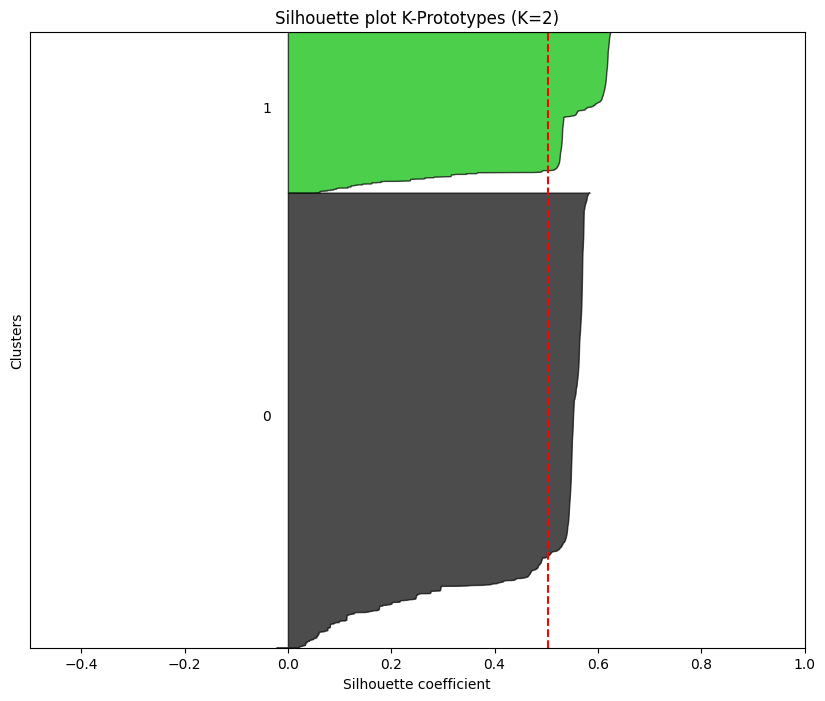

In [128]:
drawSillouette(table_X, kmeans.labels_, "K-Prototypes (K=2)")

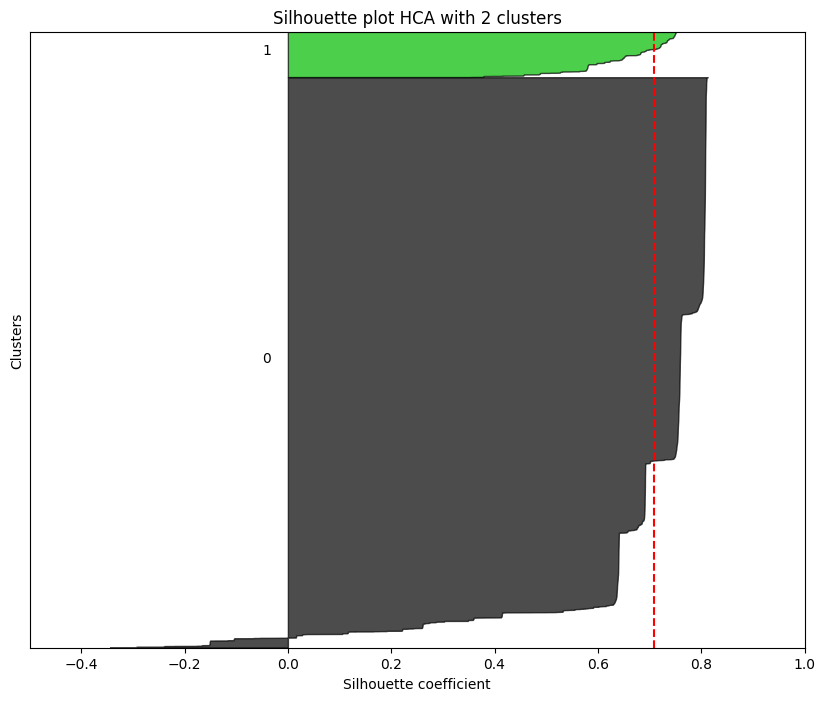

In [129]:
drawSillouette(table_X, hca.labels_, "HCA with 2 clusters")

### MultiClass 

In [202]:
table_X, table_Y, features, target_name = load_data(df)
features

array(['Type', 'Age', 'Breed1', 'Gender', 'Color1', 'Color2',
       'MaturitySize', 'FurLength', 'Vaccinated', 'Dewormed',
       'Sterilized', 'Quantity', 'Fee', 'State', 'PhotoAmt'], dtype=object)

In [203]:
scaler = StandardScaler() # Just to a mean of 0 and std of 1, dealing with outliers

original = pd.DataFrame(table_X, columns=features)

scaled = scaler.fit_transform(original[['Age', 'Quantity', 'Fee', 'PhotoAmt']])

scaled_df = pd.DataFrame(scaled,columns=['Age', 'Quantity', 'Fee', 'PhotoAmt'])

# print(scaled_df.describe())

# Combine scaled continuous and untouched categorical features
final_data = pd.concat([scaled_df, original[['Type', 'Breed1', 'Gender', 'Color1', 'Color2',
       'MaturitySize', 'FurLength', 'Vaccinated', 'Dewormed',
       'Sterilized', 'State']].reset_index(drop=True)], axis=1)

final_data = final_data.dropna()  # Optionally, replace missing values


# Resulting matrix for clustering
table_X = final_data.to_numpy()

# Verifying the shape and content
print(f"Shape of the array: {table_X.shape}")
print(table_X)

Shape of the array: (14993, 15)
[[-4.10465532e-01 -3.91237313e-01  1.00418405e+00 ...  2.00000000e+00
   2.00000000e+00  4.13260000e+04]
 [-5.20626900e-01 -3.91237313e-01 -2.71132050e-01 ...  3.00000000e+00
   3.00000000e+00  4.14010000e+04]
 [-5.20626900e-01 -3.91237313e-01 -2.71132050e-01 ...  1.00000000e+00
   2.00000000e+00  4.13260000e+04]
 ...
 [-4.65546216e-01  2.32536384e+00  1.11462780e-01 ...  1.00000000e+00
   3.00000000e+00  4.13260000e+04]
 [-7.99814291e-02 -3.91237313e-01 -2.71132050e-01 ...  1.00000000e+00
   1.00000000e+00  4.13360000e+04]
 [-5.20626900e-01 -3.91237313e-01 -2.71132050e-01 ...  2.00000000e+00
   2.00000000e+00  4.13320000e+04]]


In [204]:
kmeans = KPrototypes(n_clusters=5,n_init=10,random_state=0,) # Because we want to see if he can cluster the 5 classes 
kmeans.fit(table_X, categorical= categorical_indices)

hca = AgglomerativeClustering(n_clusters=5)
hca.fit(table_X)

AgglomerativeClustering(n_clusters=5)

In [205]:
results2.append(add_separator("Multiclass K-Prototypes"))
kprototypes_metrics = compute_clustering_metrics(table_X, table_Y, kmeans.labels_, "Intrinsic + Extrinsic Metrics")
results2.append(kprototypes_metrics)
results2.append(add_separator("Multiclass HCA"))
hca_metrics = compute_clustering_metrics(table_X, table_Y, hca.labels_, "Intrinsic + Extrinsic Metrics")
results2.append(hca_metrics)

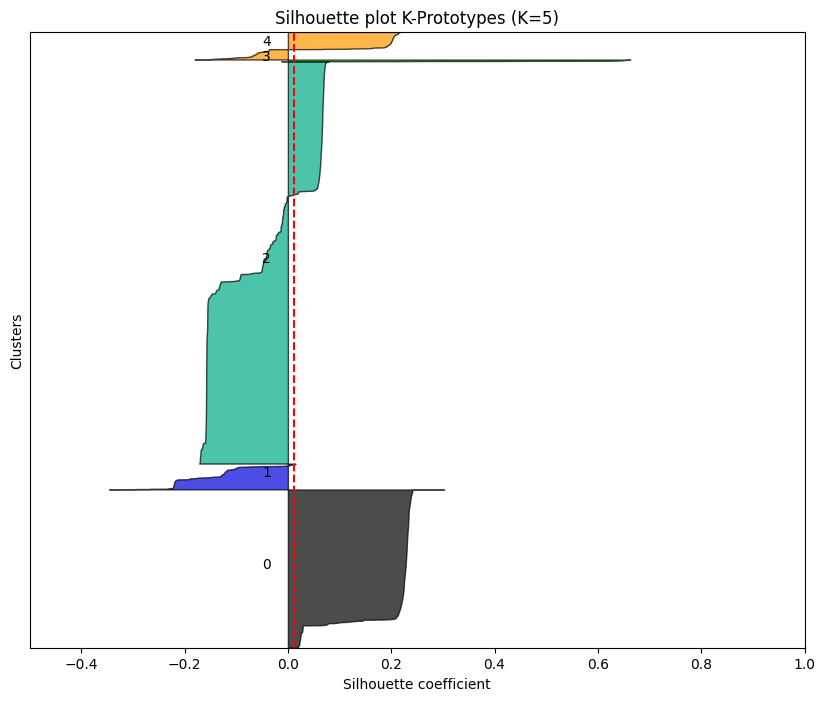

In [135]:
drawSillouette(table_X, kmeans.labels_, "K-Prototypes (K=5)")

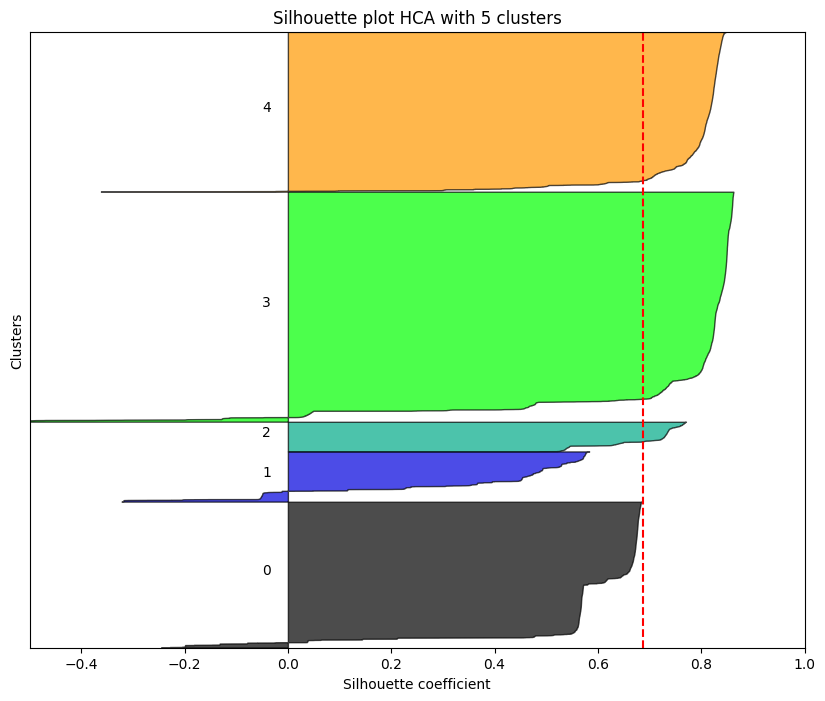

In [136]:
drawSillouette(table_X, hca.labels_, "HCA with 5 clusters")

### Cats and Dogs instances

In [206]:
table_X_dog, table_Y_dog, features, target_name = load_data(df_dog_mul)

table_X_cat, table_Y_cat, features, target_name = load_data(df_cat_mul)

In [207]:
scaler = StandardScaler() # Just to a mean of 0 and std of 1, dealing with outliers

original_dog = pd.DataFrame(table_X_dog, columns=features)
original_cat = pd.DataFrame(table_X_cat, columns=features)

scaled_dog = scaler.fit_transform(original_dog[['Age', 'Quantity', 'Fee', 'PhotoAmt']])
scaled_cat = scaler.fit_transform(original_cat[['Age', 'Quantity', 'Fee', 'PhotoAmt']])

scaled_df_dog = pd.DataFrame(scaled_dog,columns=['Age', 'Quantity', 'Fee', 'PhotoAmt'])
scaled_df_cat = pd.DataFrame(scaled_cat,columns=['Age', 'Quantity', 'Fee', 'PhotoAmt'])

# print(scaled_df.describe())

# Combine scaled continuous and untouched categorical features
final_data_dog = pd.concat([scaled_df_dog, original_dog[['Type', 'Breed1', 'Gender', 'Color1', 'Color2',
       'MaturitySize', 'FurLength', 'Vaccinated', 'Dewormed',
       'Sterilized', 'State']].reset_index(drop=True)], axis=1)
final_data_cat = pd.concat([scaled_df_cat, original_cat[['Type', 'Breed1', 'Gender', 'Color1', 'Color2',
       'MaturitySize', 'FurLength', 'Vaccinated', 'Dewormed',
       'Sterilized', 'State']].reset_index(drop=True)], axis=1)

final_data_dog = final_data_dog.dropna()  # Optionally, replace missing values
final_data_cat = final_data_cat.dropna()  # Optionally, replace missing values

# Resulting matrix for clustering
table_X_dog = final_data_dog.to_numpy()

# Verifying the shape and content
print(f"Shape of the array: {table_X_dog.shape}")
print(table_X_dog)

# Resulting matrix for clustering
table_X_cat = final_data_cat.to_numpy()

# Verifying the shape and content
print(f"Shape of the array: {table_X_cat.shape}")
print(table_X_cat)

Shape of the array: (8132, 15)
[[-5.56980756e-01 -3.42943710e-01 -2.69700671e-01 ...  1.00000000e+00
   2.00000000e+00  4.13260000e+04]
 [-4.16638242e-01 -3.42943710e-01  1.39548569e+00 ...  1.00000000e+00
   2.00000000e+00  4.14010000e+04]
 [-5.56980756e-01 -3.42943710e-01 -2.69700671e-01 ...  2.00000000e+00
   2.00000000e+00  4.13260000e+04]
 ...
 [ 5.18978516e-01 -3.42943710e-01 -2.69700671e-01 ...  3.00000000e+00
   2.00000000e+00  4.13260000e+04]
 [-3.23076566e-01 -3.42943710e-01 -2.69700671e-01 ...  1.00000000e+00
   2.00000000e+00  4.14010000e+04]
 [-5.56980756e-01 -3.42943710e-01 -2.69700671e-01 ...  2.00000000e+00
   2.00000000e+00  4.13320000e+04]]
Shape of the array: (6861, 15)
[[-3.55766590e-01 -4.56149179e-01  1.33666412e+00 ...  2.00000000e+00
   2.00000000e+00  4.13260000e+04]
 [-5.12376020e-01 -4.56149179e-01 -2.86745597e-01 ...  3.00000000e+00
   3.00000000e+00  4.14010000e+04]
 [-3.55766590e-01 -4.56149179e-01 -2.86745597e-01 ...  2.00000000e+00
   2.00000000e+00  4.1

### Multiclass

In [208]:
kmeans_dog = KPrototypes(n_clusters=5,n_init=10,random_state=0,) # Because we want to see if he can cluster the 5 classes 
kmeans_dog.fit(table_X_dog, categorical= categorical_indices)

kmeans_cat = KPrototypes(n_clusters=5,n_init=10,random_state=0,) # Because we want to see if he can cluster the 5 classes 
kmeans_cat.fit(table_X_cat, categorical= categorical_indices)

hca_dog = AgglomerativeClustering(n_clusters=5)
hca_dog.fit(table_X_dog)

hca_cat = AgglomerativeClustering(n_clusters=5)
hca_cat.fit(table_X_cat)

AgglomerativeClustering(n_clusters=5)

In [209]:
results2.append(add_separator("Multiclass K-Prototypes Dogs"))
kprototypes_dog_metrics = compute_clustering_metrics(table_X_dog, table_Y_dog, kmeans_dog.labels_, "Intrinsic + Extrinsic Metrics")
results2.append(kprototypes_dog_metrics)
results2.append(add_separator("Multiclass HCA Dogs"))
hca_dog_metrics = compute_clustering_metrics(table_X_dog, table_Y_dog, hca_dog.labels_, "Intrinsic + Extrinsic Metrics")
results2.append(hca_dog_metrics)


In [210]:
results2.append(add_separator("Multiclass K-Prototypes Cats"))
kprototypes_cat_metrics = compute_clustering_metrics(table_X_cat, table_Y_cat, kmeans_cat.labels_, "Intrinsic + Extrinsic Metrics")
results2.append(kprototypes_cat_metrics)
results2.append(add_separator("Multiclass HCA Cats"))
hca_cat_metrics = compute_clustering_metrics(table_X_cat, table_Y_cat, hca_cat.labels_, "Intrinsic + Extrinsic Metrics")
results2.append(hca_cat_metrics)

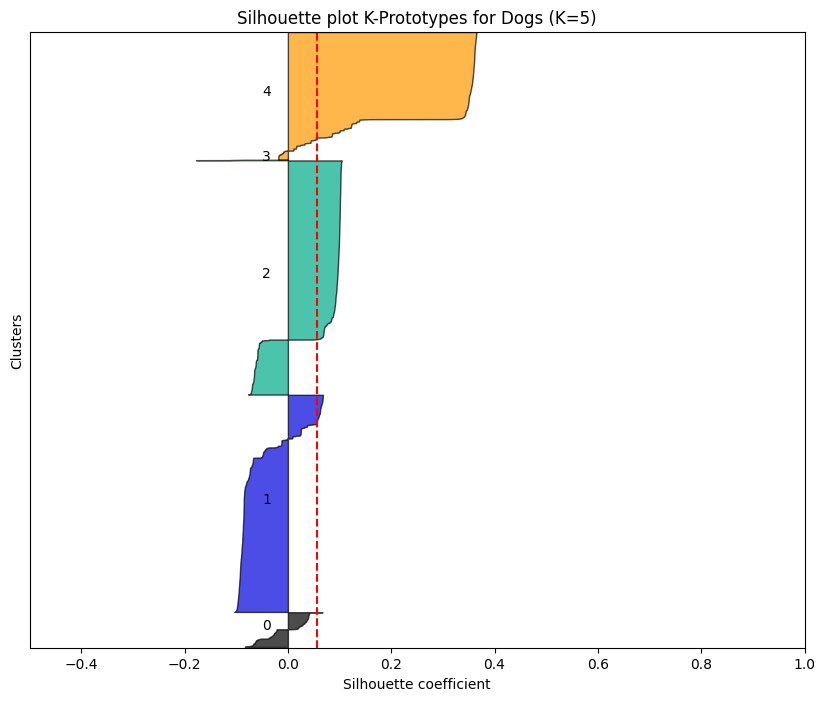

In [142]:
drawSillouette(table_X_dog, kmeans_dog.labels_, "K-Prototypes for Dogs (K=5)")

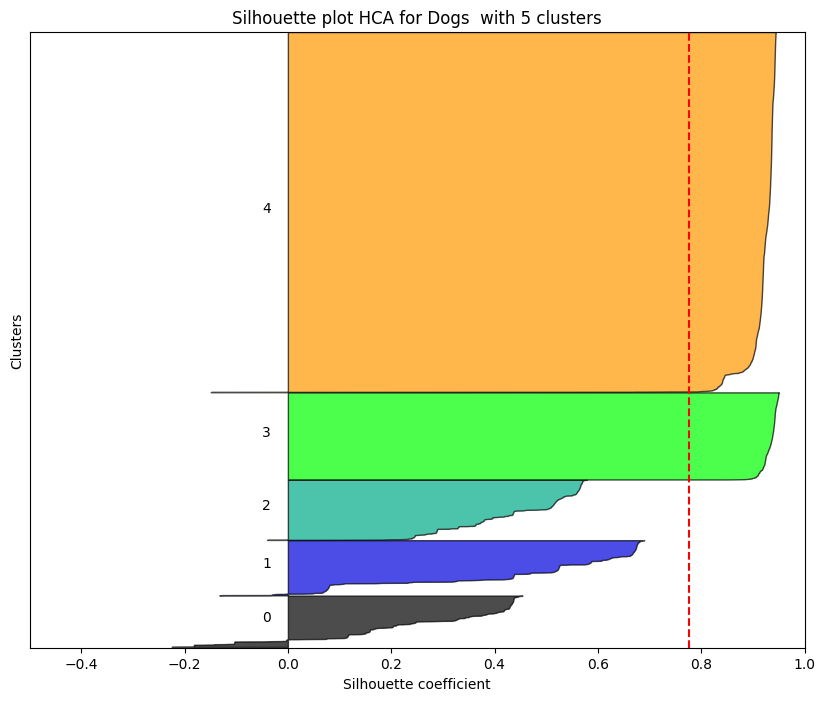

In [143]:
drawSillouette(table_X_dog, hca_dog.labels_, "HCA for Dogs  with 5 clusters")

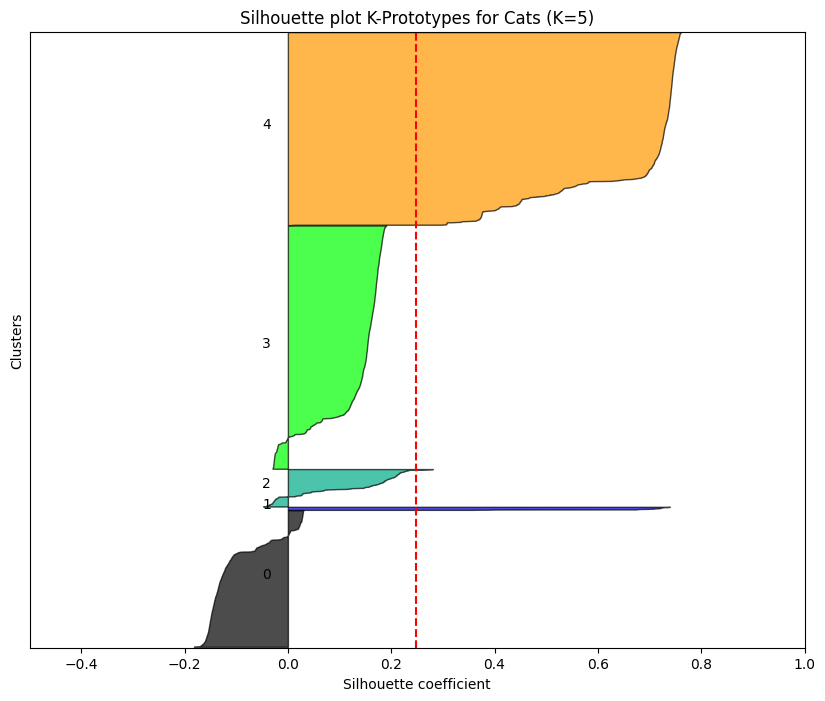

In [144]:
drawSillouette(table_X_cat, kmeans_cat.labels_, "K-Prototypes for Cats (K=5)")

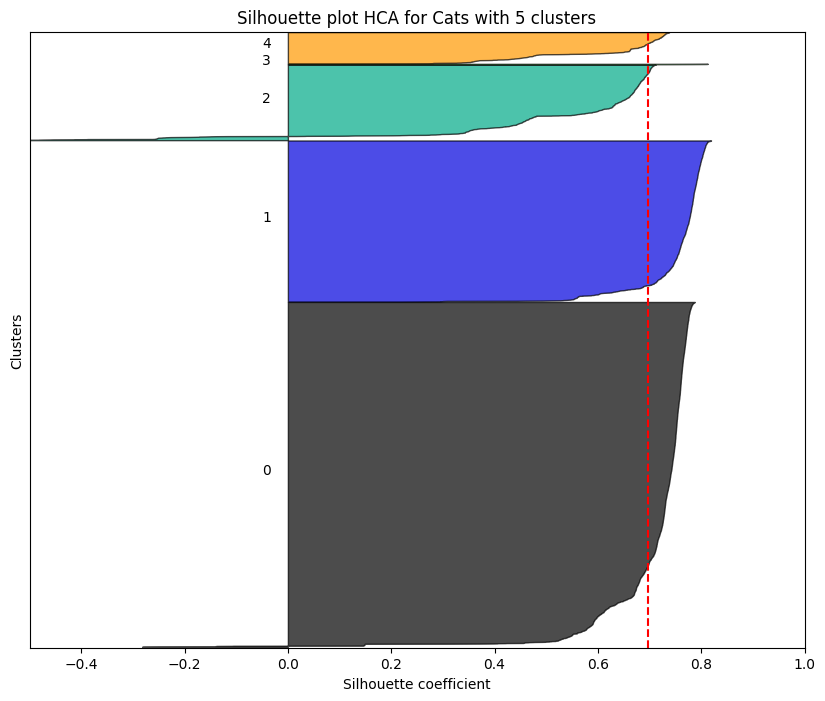

In [145]:
drawSillouette(table_X_cat, hca_cat.labels_, "HCA for Cats with 5 clusters")

### Binary Class

In [211]:
table_X_dog, table_Y_dog, features, target_name = load_data(df_dog_bin)

table_X_cat, table_Y_cat, features, target_name = load_data(df_cat_bin)


In [212]:
scaler = StandardScaler() # Just to a mean of 0 and std of 1, dealing with outliers

original_dog = pd.DataFrame(table_X_dog, columns=features)
original_cat = pd.DataFrame(table_X_cat, columns=features)

scaled_dog = scaler.fit_transform(original_dog[['Age', 'Quantity', 'Fee', 'PhotoAmt']])
scaled_cat = scaler.fit_transform(original_cat[['Age', 'Quantity', 'Fee', 'PhotoAmt']])

scaled_df_dog = pd.DataFrame(scaled_dog,columns=['Age', 'Quantity', 'Fee', 'PhotoAmt'])
scaled_df_cat = pd.DataFrame(scaled_cat,columns=['Age', 'Quantity', 'Fee', 'PhotoAmt'])

# print(scaled_df.describe())

# Combine scaled continuous and untouched categorical features
final_data_dog = pd.concat([scaled_df_dog, original_dog[['Type', 'Breed1', 'Gender', 'Color1', 'Color2',
       'MaturitySize', 'FurLength', 'Vaccinated', 'Dewormed',
       'Sterilized', 'State']].reset_index(drop=True)], axis=1)
final_data_cat = pd.concat([scaled_df_cat, original_cat[['Type', 'Breed1', 'Gender', 'Color1', 'Color2',
       'MaturitySize', 'FurLength', 'Vaccinated', 'Dewormed',
       'Sterilized', 'State']].reset_index(drop=True)], axis=1)

final_data_dog = final_data_dog.dropna()  # Optionally, replace missing values
final_data_cat = final_data_cat.dropna()  # Optionally, replace missing values

# Resulting matrix for clustering
table_X_dog = final_data_dog.to_numpy()

# Verifying the shape and content
print(f"Shape of the array: {table_X_dog.shape}")
print(table_X_dog)

# Resulting matrix for clustering
table_X_cat = final_data_cat.to_numpy()

# Verifying the shape and content
print(f"Shape of the array: {table_X_cat.shape}")
print(table_X_cat)

Shape of the array: (8689, 15)
[[-5.57232339e-01 -3.39931882e-01 -2.72702780e-01 ...  1.00000000e+00
   2.00000000e+00  4.13260000e+04]
 [-5.57232339e-01 -3.39931882e-01 -2.72702780e-01 ...  2.00000000e+00
   2.00000000e+00  4.13260000e+04]
 [-6.04160749e-01  3.00510563e+00 -2.72702780e-01 ...  2.00000000e+00
   2.00000000e+00  4.13260000e+04]
 ...
 [ 3.81335865e-01 -3.39931882e-01 -2.72702780e-01 ...  1.00000000e+00
   2.00000000e+00  4.13260000e+04]
 [-5.10303929e-01  3.29075620e-01 -2.72702780e-01 ...  2.00000000e+00
   2.00000000e+00  4.13260000e+04]
 [-3.22590288e-01 -3.39931882e-01 -2.72702780e-01 ...  1.00000000e+00
   2.00000000e+00  4.13260000e+04]]
Shape of the array: (7150, 15)
[[-3.68752807e-01 -4.51777526e-01  1.37319637e+00 ...  2.00000000e+00
   2.00000000e+00  4.13260000e+04]
 [-5.32459776e-01 -4.51777526e-01 -2.87935766e-01 ...  3.00000000e+00
   3.00000000e+00  4.14010000e+04]
 [-3.68752807e-01 -4.51777526e-01 -2.87935766e-01 ...  2.00000000e+00
   2.00000000e+00  4.1

In [213]:
kmeans_dog = KPrototypes(n_clusters=2,n_init=10,random_state=0,) # Because we want to see if he can cluster the 2 classes 
kmeans_dog.fit(table_X_dog, categorical= categorical_indices)

kmeans_cat = KPrototypes(n_clusters=2,n_init=10,random_state=0,) # Because we want to see if he can cluster the 2 classes 
kmeans_cat.fit(table_X_cat, categorical= categorical_indices)

hca_dog = AgglomerativeClustering(n_clusters=2)
hca_dog.fit(table_X_dog)

hca_cat = AgglomerativeClustering(n_clusters=2)
hca_cat.fit(table_X_cat)

AgglomerativeClustering()

In [214]:
results2.append(add_separator("Binary K-Prototypes Dogs"))
kprototypes_dog_metrics = compute_clustering_metrics(table_X_dog, table_Y_dog, kmeans_dog.labels_, "Intrinsic + Extrinsic Metrics")
results2.append(kprototypes_dog_metrics)
results2.append(add_separator("Binary HCA Dogs"))
hca_dog_metrics = compute_clustering_metrics(table_X_dog, table_Y_dog, hca_dog.labels_, "Intrinsic + Extrinsic Metrics")
results2.append(hca_dog_metrics)

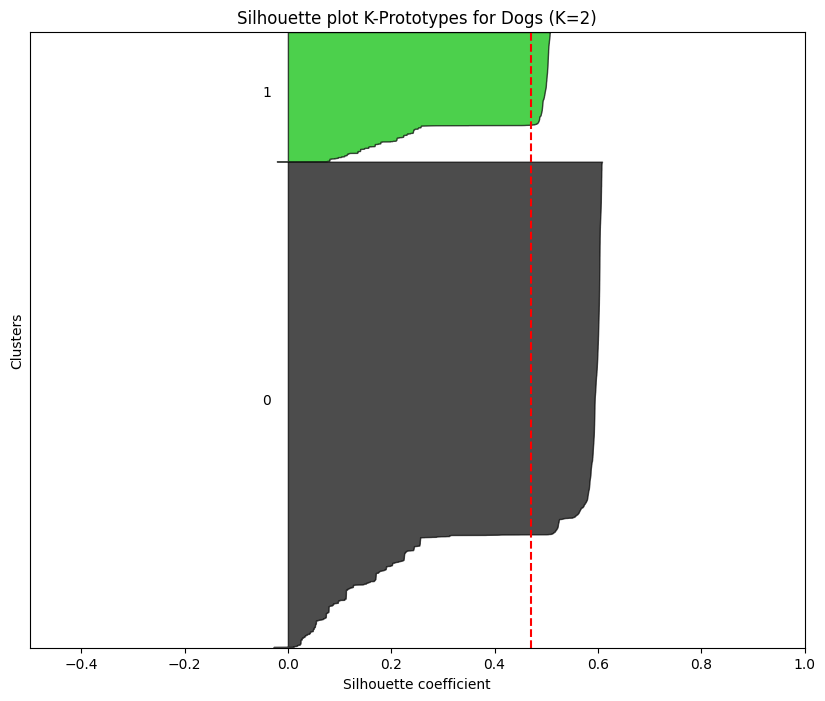

In [151]:
drawSillouette(table_X_dog, kmeans_dog.labels_, "K-Prototypes for Dogs (K=2)")

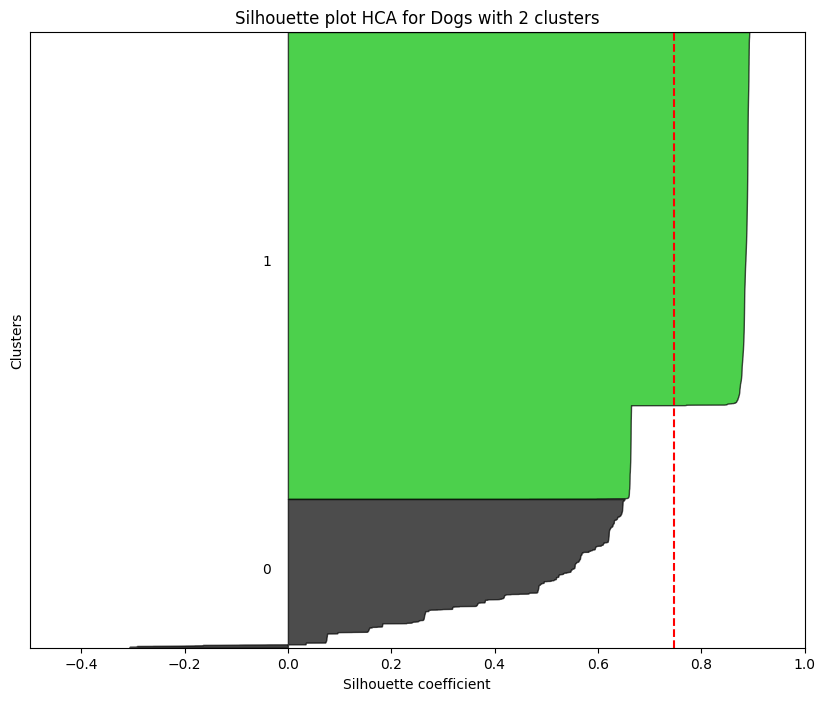

In [152]:
drawSillouette(table_X_dog, hca_dog.labels_, "HCA for Dogs with 2 clusters")

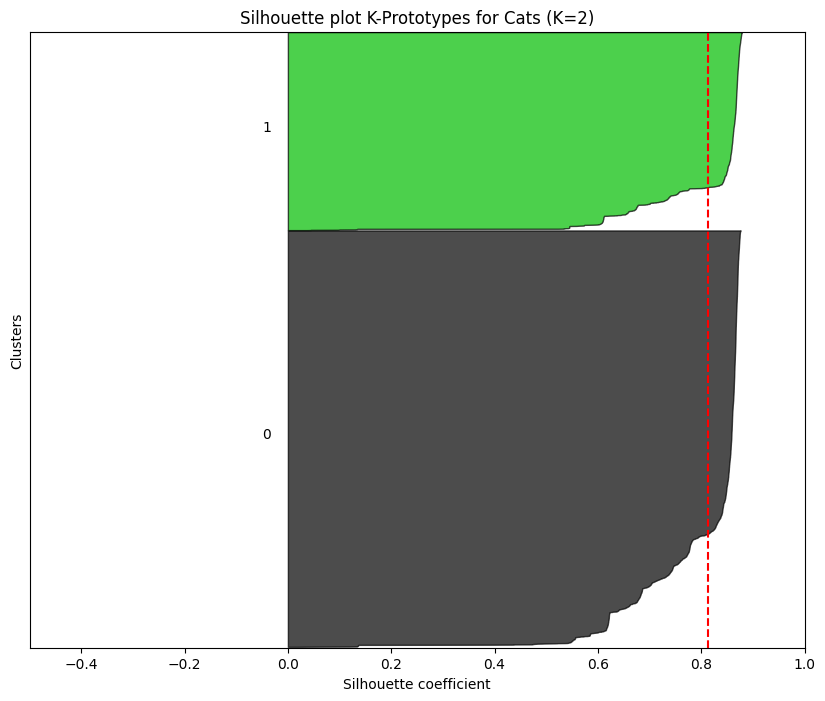

In [153]:
drawSillouette(table_X_cat, kmeans_cat.labels_, "K-Prototypes for Cats (K=2)")

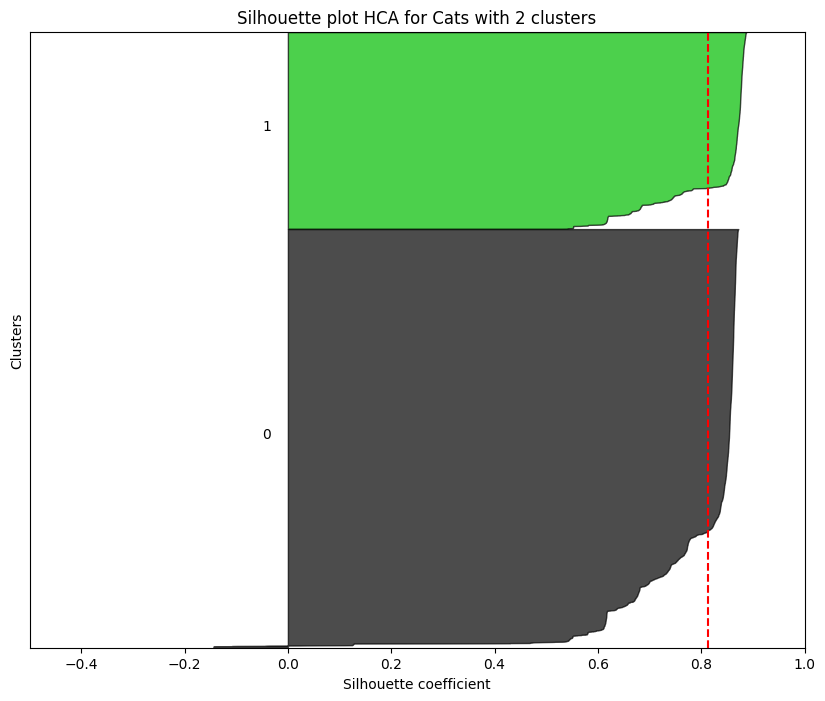

In [154]:
drawSillouette(table_X_cat, hca_cat.labels_, "HCA for Cats with 2 clusters")

In [215]:
metrics_df = pd.DataFrame(results2)
metrics_df

,Task,Metric,Silhouette Score,Calinski-Harabasz Score,Davies-Bouldin Score,Homogeneity Score,Completeness Score,V-Measure Score,FMI Score,Contingency Matrix
0,Binary K-Prototypes,---,---,---,---,---,---,---,---,---
1,Intrinsic + Extrinsic Metrics,---,0.503254,4965.151405,0.978776,0.002436,0.002806,0.002608,0.577318,"[[[4195, 7509], [1742, 2393]]]"
2,Binary HCA,---,---,---,---,---,---,---,---,---
3,Intrinsic + Extrinsic Metrics,---,0.708405,18762.764603,0.476607,0.007904,0.019911,0.011316,0.670544,"[[[5697, 8978], [240, 924]]]"
4,Multiclass K-Prototypes,---,---,---,---,---,---,---,---,---
5,Intrinsic + Extrinsic Metrics,---,0.012385,1096.992249,5.390698,0.002707,0.004335,0.003332,0.346171,"[[[112, 814, 997, 732, 1193], [28, 149, 153, 1..."
6,Multiclass HCA,---,---,---,---,---,---,---,---,---
7,Intrinsic + Extrinsic Metrics,---,0.686582,31639.164601,0.476344,0.007011,0.00729,0.007148,0.262648,"[[[103, 731, 915, 662, 1139], [40, 316, 316, 3..."
8,Multiclass K-Prototypes Dogs,---,---,---,---,---,---,---,---,---
9,Intrinsic + Extrinsic Metrics,---,0.056453,291.747422,15.25626,0.003328,0.003903,0.003592,0.281885,"[[[12, 92, 107, 86, 164], [67, 507, 712, 731, ..."


# Discussion



**Binary K-Prototypes vs. Binary HCA**

**Intrinsic Metrics:**
K-Prototypes achieved a lower Silhouette Score (0.503) compared to HCA (0.708), indicating that HCA formed clusters with better-defined boundaries.
Calinski-Harabasz Score was significantly higher for HCA (18762.76 vs. 4965.15), suggesting better cluster separation in HCA.
Davies-Bouldin Score was also better for HCA (0.476 vs. 0.979), indicating less within-cluster scatter.
**Extrinsic Metrics:**
Homogeneity, Completeness, and V-Measure were low for both methods, with HCA slightly outperforming in Homogeneity and FMI.
Contingency matrices revealed more balanced cluster distributions for HCA.

**Multiclass K-Prototypes vs. Multiclass HCA**

**Intrinsic Metrics:**
HCA again outperformed K-Prototypes in Silhouette Score (0.687 vs. 0.012) and Calinski-Harabasz Score (31639.16 vs. 1096.99).
Davies-Bouldin Score highlighted the limitations of K-Prototypes (5.39 vs. 0.476).
**Extrinsic Metrics:**
Both methods struggled with Homogeneity, Completeness, and V-Measure, but HCA showed slightly better consistency.
FMI scores were higher for K-Prototypes (0.346) compared to HCA (0.263).

**Multiclass K-Prototypes and HCA for Dogs**

**Intrinsic Metrics:**
HCA performed significantly better with a Silhouette Score of 0.777 compared to 0.056 for K-Prototypes.
HCA's Calinski-Harabasz Score was much higher (29577.93 vs. 291.75), and Davies-Bouldin Score was far lower (0.709 vs. 15.26), suggesting more coherent clusters.
**Extrinsic Metrics:**
HCA achieved a higher Homogeneity and FMI, while K-Prototypes failed to produce meaningful clusters.
Contingency matrices revealed better alignment with true classes for HCA.

**Multiclass K-Prototypes and HCA for Cats**

**Intrinsic Metrics:**
HCA consistently outperformed K-Prototypes with a Silhouette Score of 0.697 vs. 0.247.
Calinski-Harabasz Score was much higher for HCA (36763.25 vs. 9268.77), indicating better-defined clusters.
Davies-Bouldin Score (6.46 for K-Prototypes vs. 0.433 for HCA) highlighted the superior intra-cluster tightness of HCA.
**Extrinsic Metrics:**
HCA outperformed in all external metrics, albeit with marginal gains due to the difficulty of the clustering task.
Contingency matrices showed better alignment for HCA.

**Binary K-Prototypes and HCA for Dogs**

**Intrinsic Metrics:**
HCA outperformed K-Prototypes in Silhouette Score (0.747 vs. 0.470) and Calinski-Harabasz Score (23354.10 vs. 1347.23).
Davies-Bouldin Score was better for HCA (0.531 vs. 1.688).
**Extrinsic Metrics:**
HCA achieved higher scores across all extrinsic metrics, particularly Homogeneity and Completeness.
Contingency matrices highlighted the superior clustering performance of HCA.

**Conclusions on the results:**

In this task, Hierarchical Clustering performed better than K-Prototypes, often showing better intrinsic metrics and overall cluster quality. On the other hand, K-Prototypes struggled with cluster structure, leading to overlapping clusters. Despite this, both models struggled to correctly cluster instances based on their classes, particularly in multiclass clustering. To improve these results, we could explore more advanced methods like Gaussian Mixture Models, as we learned in the Advanced Course, or other techniques like DBSCAN, OPTICS, Spectral Clustering, and Deep Clustering methods. These could help capture more nuances in the data and improve clustering accuracy.

